In [8]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

data_dir = 'dataset'

train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

train_transform = transforms.Compose([
transforms.ToTensor(),
])

test_transform = transforms.Compose([
transforms.ToTensor(),
])

train_dataset.transform = train_transform
test_dataset.transform = test_transform

m=len(train_dataset)

train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
test_batch_size=256
train_batch_size = 7000
valid_batch_size = 2000

train_loader = torch.utils.data.DataLoader(train_data, batch_size=train_batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=valid_batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=test_batch_size,shuffle=True)


In [2]:
class Encoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        
        ### Convolutional section
        self.encoder_cnn = nn.Sequential(
            nn.Conv2d(1, 16, 5, stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2),
            nn.BatchNorm2d(16),
            # nn.ReLU(True),
            nn.Conv2d(16, 32, 5, stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2),
            nn.Conv2d(32, 64, 5, stride=1, padding=2),
            nn.ReLU(True),
            nn.MaxPool2d(2, stride=2)
        )
        
        ### Flatten layer
        self.flatten = nn.Flatten(start_dim=1)
### Linear section
        self.encoder_lin = nn.Sequential(
            nn.Linear(3 * 3 * 64, 128),
            nn.ReLU(True),
            nn.Linear(128, 32),
            nn.ReLU(True),
            nn.Linear(32, encoded_space_dim),
        )
        
    def forward(self, x):
        x = self.encoder_cnn(x)
        x = self.flatten(x)
        x = self.encoder_lin(x)
        return x
class Decoder(nn.Module):
    
    def __init__(self, encoded_space_dim):
        super().__init__()
        self.decoder_lin = nn.Sequential(
            nn.Linear(encoded_space_dim, 32),
            nn.ReLU(True),
            nn.Linear(32, 128),
            nn.ReLU(True),
            nn.Linear(128, 3 * 3 * 64),
            nn.ReLU(True)
        )

        self.unflatten = nn.Unflatten(dim=1, 
        unflattened_size=(64, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(64, 32, 3, 
            stride=2, output_padding=0),
            nn.BatchNorm2d(32),
            nn.ReLU(True),
            nn.ConvTranspose2d(32, 16, 3, stride=2, 
            padding=1, output_padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 1, 3, stride=2, 
            padding=1, output_padding=1)
            # nn.BatchNorm2d(8),
            # nn.ReLU(True),
            # nn.ConvTranspose2d(8, 1, 3, stride=2, 
            # padding=1, output_padding=1),
            # nn.ReLU(True),
            # nn.MaxPool2d(2, stride=2)
        )
        
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [3]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784
        n_out = 1

        ### Flatten layer
        # self.flatten = nn.Flatten(start_dim=1)
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        # x = self.flatten(x)
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x

In [4]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.003

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 8

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
encoder = Encoder(encoded_space_dim=d)
decoder = Decoder(encoded_space_dim=d)
a_params_to_optimize = [
    {'params': encoder.parameters()},
    {'params': decoder.parameters()}
]

a_optimizer = torch.optim.Adam(a_params_to_optimize, lr=lr, weight_decay=1e-05)

discriminator = DiscriminatorNet()

d_params_to_optimize = [
    {'params': discriminator.parameters()}]

# d_optimizer = torch.optim.Adam(d_params_to_optimize, lr=0.0002, weight_decay=1e-05)


# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

# Move both the encoder and the decoder to the selected device
encoder.to(device)
decoder.to(device)
discriminator.to(device)

Selected device: cuda


DiscriminatorNet(
  (hidden0): Sequential(
    (0): Linear(in_features=784, out_features=1024, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden1): Sequential(
    (0): Linear(in_features=1024, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (hidden2): Sequential(
    (0): Linear(in_features=512, out_features=256, bias=True)
    (1): LeakyReLU(negative_slope=0.2)
    (2): Dropout(p=0.3, inplace=False)
  )
  (out): Sequential(
    (0): Linear(in_features=256, out_features=1, bias=True)
    (1): Sigmoid()
  )
)

In [5]:
### Training function
def train_epoch(encoder, decoder, device, dataloader, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for image_batch, _ in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        # print(image_batch.shape)
        image_batch = image_batch.to(device)    
        # Encode data
        encoded_data = encoder(image_batch)
        # print(encoded_data.shape)
        # Decode data
        decoded_data = decoder(encoded_data)
        # print(decoded_data.shape)
        # Evaluate loss
        loss = loss_fn(decoded_data, image_batch)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        # print('\t partial train loss (single batch): %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [6]:
### Testing function
import numpy as np
test_array = np.zeros((256,1,28,28))
test_reconstructed_array = np.zeros((256,1,28,28))

def test_epoch(encoder, decoder, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    encoder.eval()
    decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for image_batch, _ in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            # Encode data
            encoded_data = encoder(image_batch)
            # Decode data
            decoded_data = decoder(encoded_data)
            conc_out.append(decoded_data.cpu())
            conc_label.append(image_batch.cpu())
            # print(image_batch.detach().cpu().numpy())
            # print(image_batch.detach().cpu().numpy().shape)
            np.append(test_array, image_batch.detach().cpu().numpy(), axis=0)
            np.append(test_reconstructed_array, decoded_data.detach().cpu().numpy(), axis=0)
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [7]:
def plot_ae_outputs(encoder,decoder,n=5):
    plt.figure(figsize=(10,4.5))
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[i][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()


 EPOCH 1/100 	 train loss 0.27436909079551697 	 val loss 0.2786443531513214


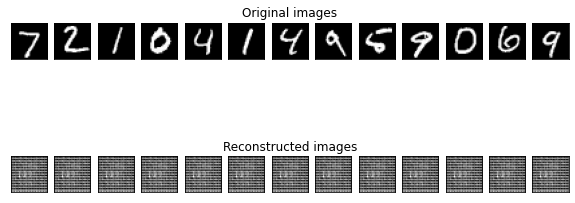


 EPOCH 2/100 	 train loss 0.20672346651554108 	 val loss 0.24401046335697174


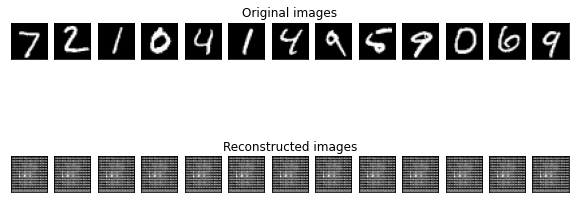


 EPOCH 3/100 	 train loss 0.16766834259033203 	 val loss 0.19874317944049835


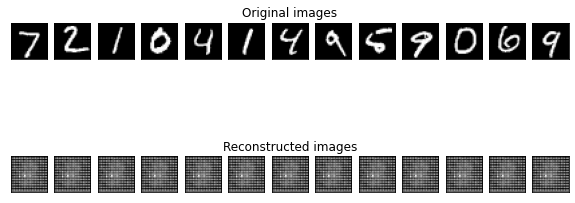


 EPOCH 4/100 	 train loss 0.13954295217990875 	 val loss 0.16162320971488953


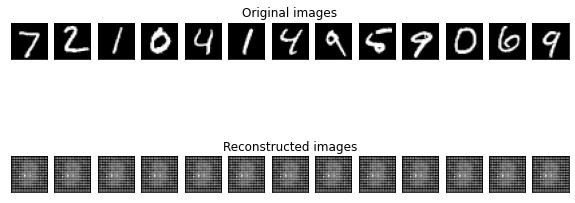


 EPOCH 5/100 	 train loss 0.11829764395952225 	 val loss 0.13210473954677582


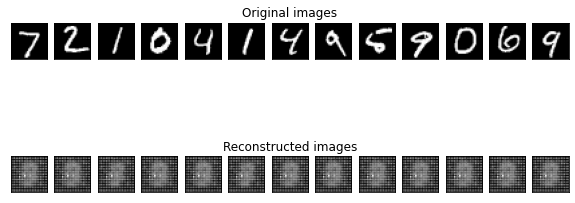

KeyboardInterrupt: ignored

In [9]:
num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
   train_loss =train_epoch(encoder,decoder,device, train_loader,loss_fn,a_optimizer)
   val_loss = test_epoch(encoder,decoder,device,test_loader,loss_fn)
   print('\n EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   diz_loss['train_loss'].append(train_loss)
   diz_loss['val_loss'].append(val_loss)
   plot_ae_outputs(encoder,decoder,n=13)

In [ ]:
test_epoch(encoder,decoder,device,test_loader,loss_fn).item()

0.03848385065793991

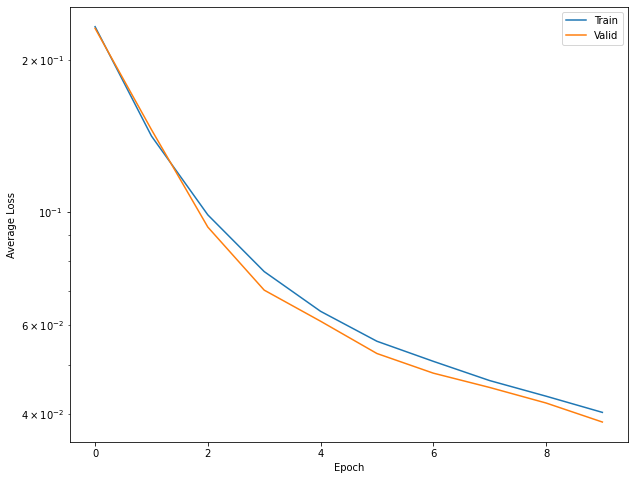

In [ ]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

In [10]:
### Training function 2
def train_epoch2(encoder, decoder, device, image, loss_fn, optimizer,noise_factor=0.3):
    # Set train mode for both the encoder and the decoder
    encoder.train()
    decoder.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    
    # Move tensor to the proper device
    # print(image_batch.shape)
    # image_batch = image_batch.to(device)    
    # Encode data
    encoded_data = encoder(image)
    # print(encoded_data.shape)
    # Decode data
    decoded_data = decoder(encoded_data)
    # print(decoded_data.shape)
    # Evaluate loss
    loss = loss_fn(decoded_data, image)
    # Backward pass
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    # Print batch loss
    # print('\t partial train loss (single batch): %f' % (loss.data))
    train_loss = loss.detach().cpu().numpy()

    return train_loss

In [14]:
import time
start_time = time.time()
plt.rcParams['image.cmap'] = 'gray'

def show_images(images):
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))

    for index, image in enumerate(images):
        plt.subplot(sqrtn, sqrtn, index+1)
        plt.imshow(image.reshape(28, 28))

In [13]:
# Discriminator Loss => BCELoss
def d_loss_function(inputs, targets):
    return nn.BCELoss()(inputs, targets)


def g_loss_function(inputs):
    targets = torch.ones(inputs.shape[0], 1).to(device)
    targets = targets.to(device)
    return nn.BCELoss()(inputs, targets)

In [12]:

# Settings
epochs = 200
lr = 0.0002
batch_size = 1500
g_optimizer = optim.Adam(a_params_to_optimize, lr=0.001, betas=(0.5, 0.999))
d_optimizer = optim.Adam(d_params_to_optimize, lr=lr, betas=(0.5, 0.999))
# Transform
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.1307,), (0.3081,))])


# Load data
train_set = torchvision.datasets.MNIST('mnist/', train=True, download=True, transform=transform)
test_set = torchvision.datasets.MNIST('mnist/', train=False, download=True, transform=transform)
train_loader = DataLoader(train_set, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_set, batch_size=batch_size, shuffle=False)


  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/train-images-idx3-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/train-labels-idx1-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to mnist/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to mnist/MNIST/raw



tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

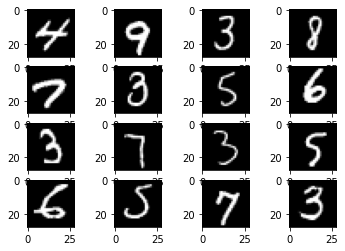

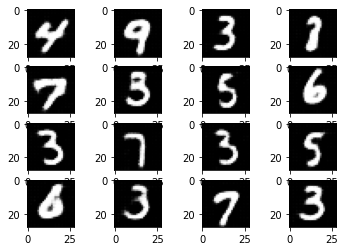

tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0099, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0094, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

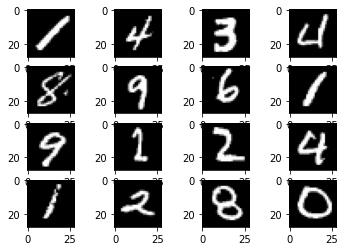

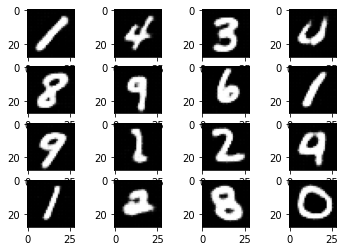

tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0092, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

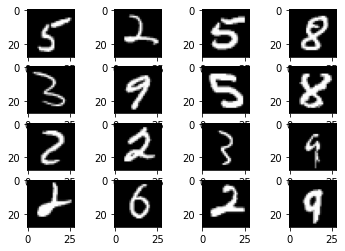

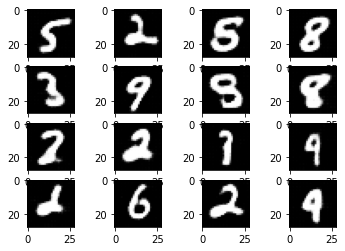

tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

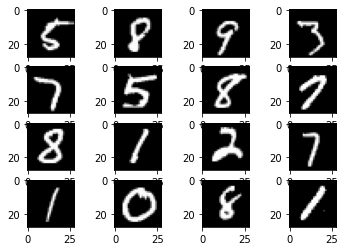

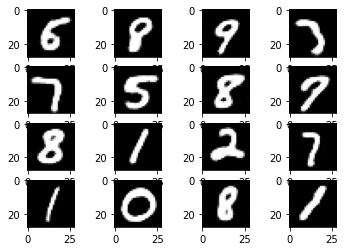

tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0091, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

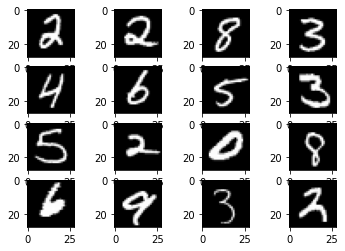

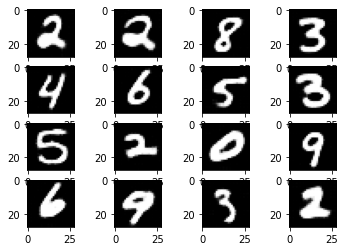

tensor(0.0092, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0092, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0094, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

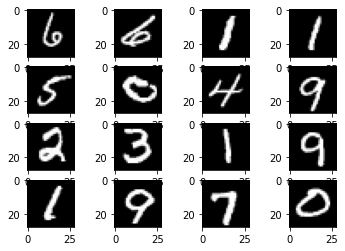

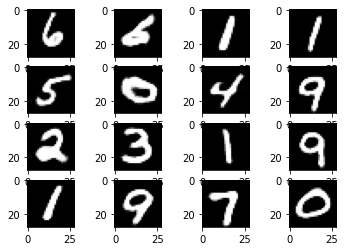

tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0091, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0116, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
D loss is increasing
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntr

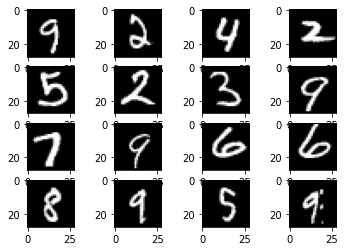

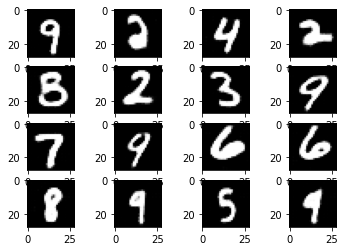

tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

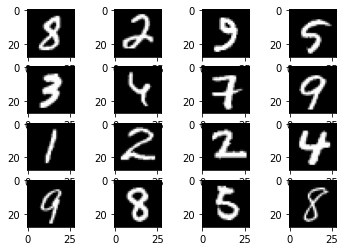

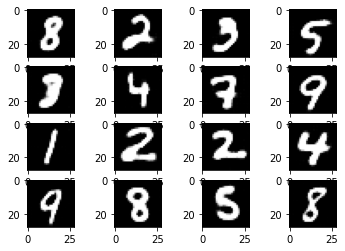

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

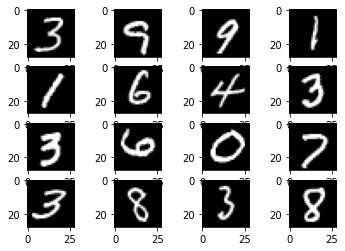

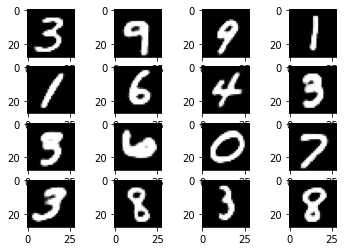

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0091, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

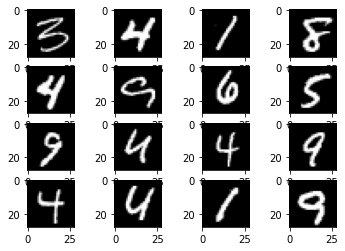

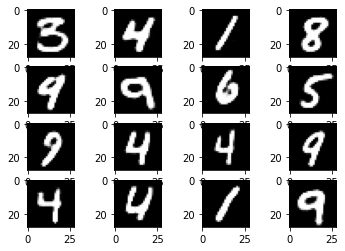

tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

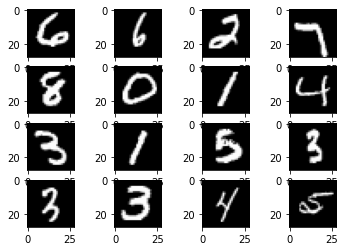

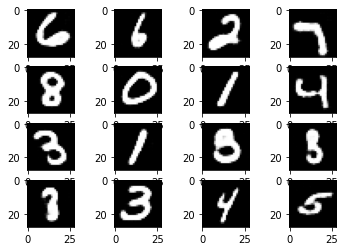

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

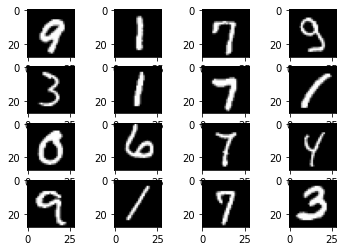

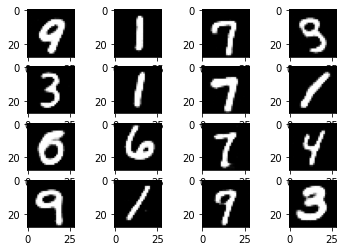

tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0095, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0096, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

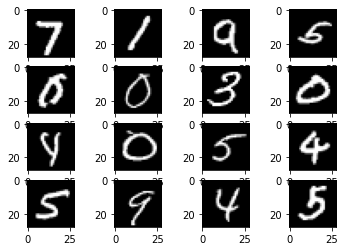

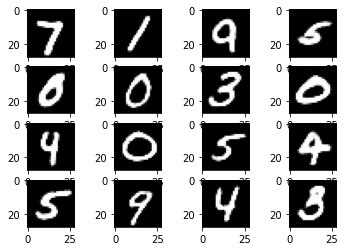

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0091, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0093, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

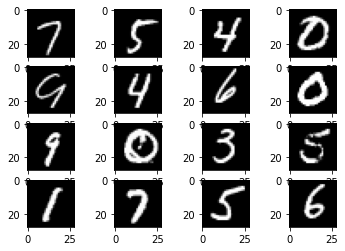

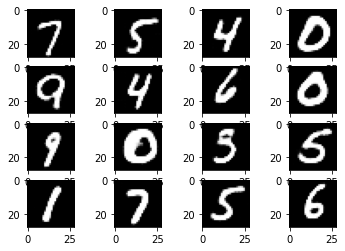

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

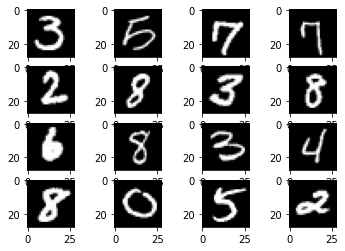

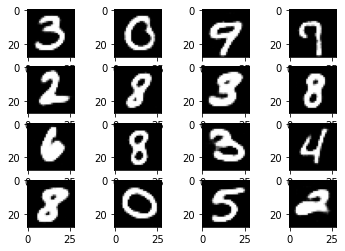

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0048, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0049, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

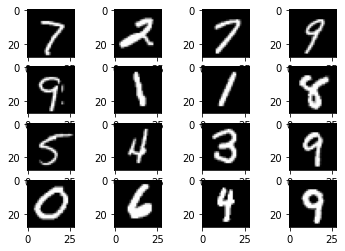

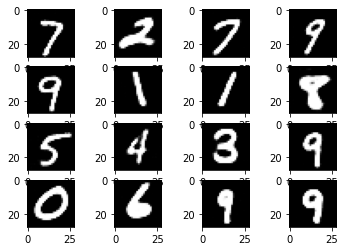

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

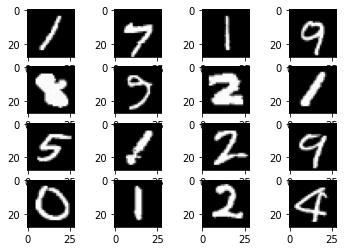

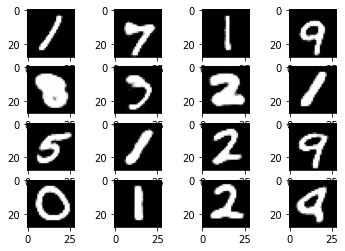

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

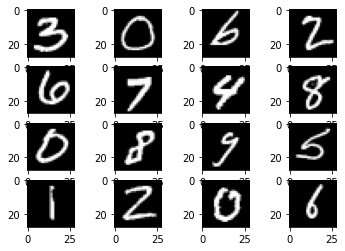

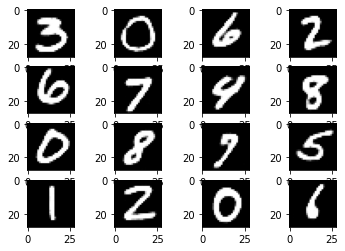

tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

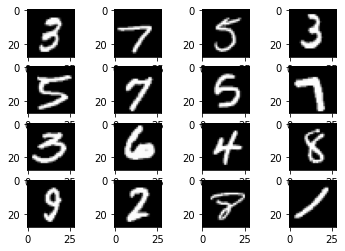

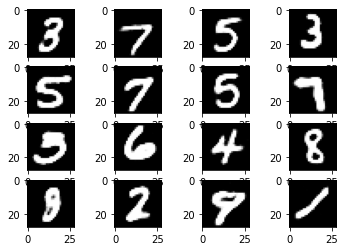

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

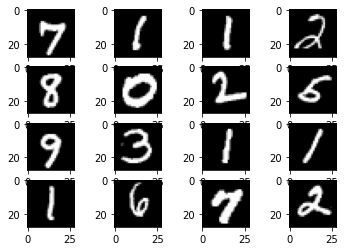

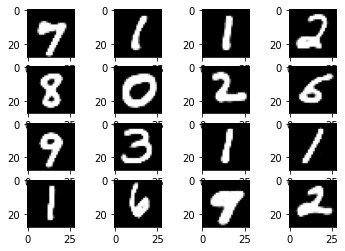

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

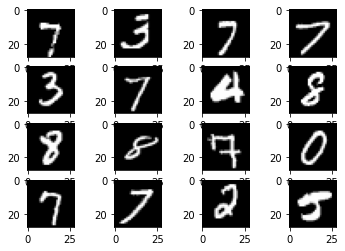

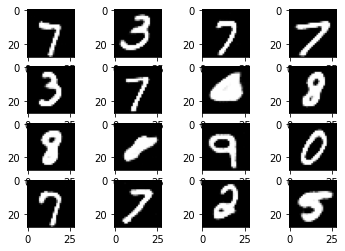

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

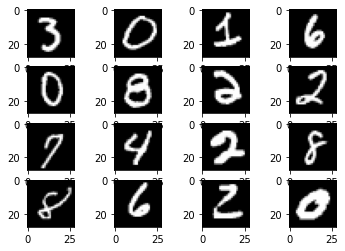

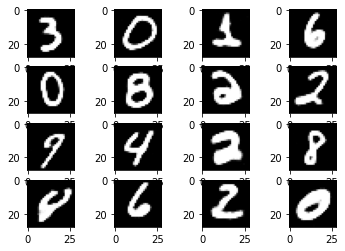

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

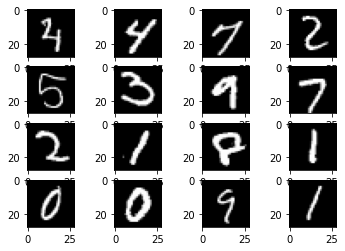

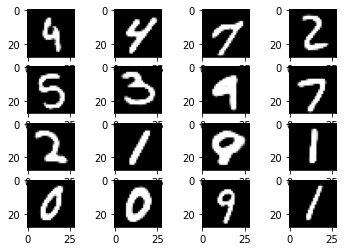

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

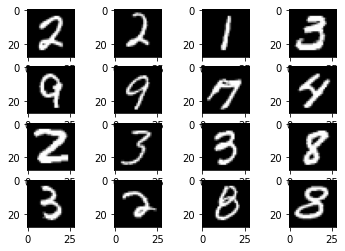

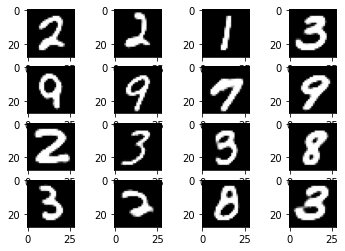

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0050, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

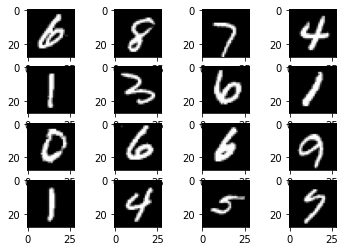

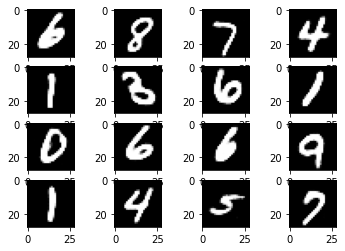

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

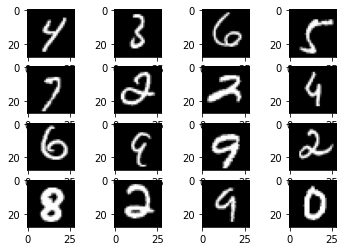

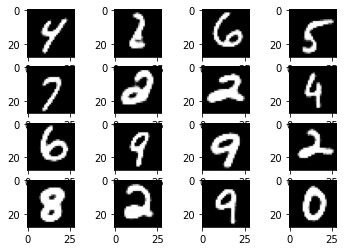

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

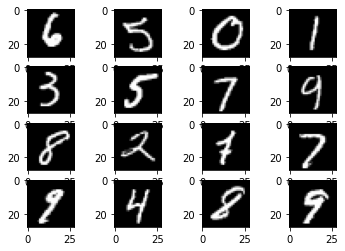

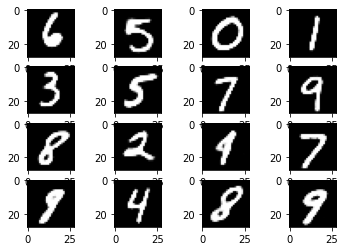

tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

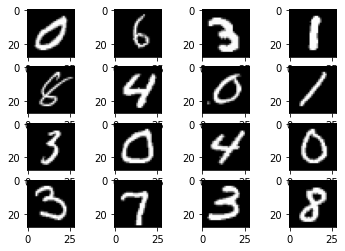

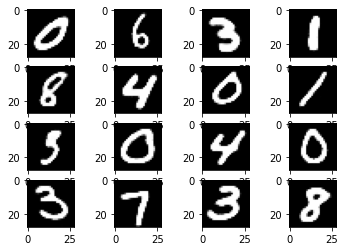

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

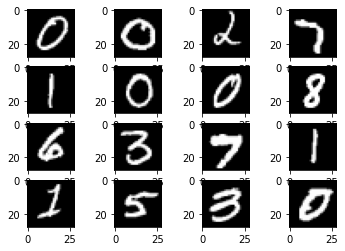

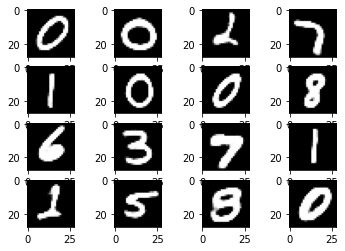

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

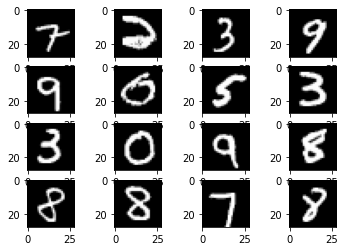

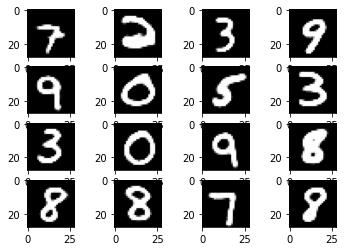

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

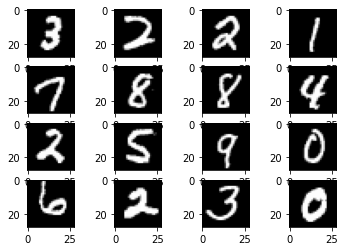

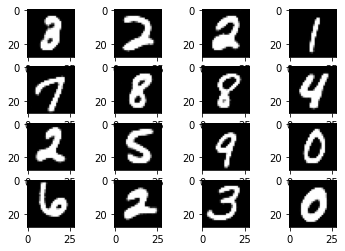

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

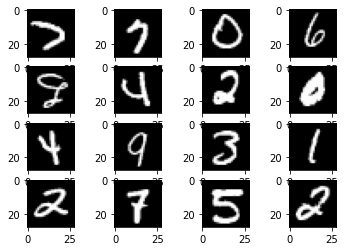

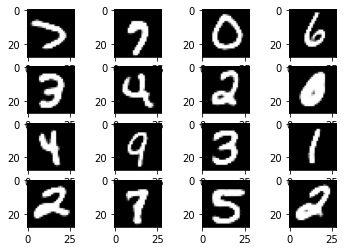

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

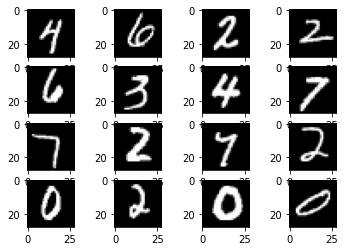

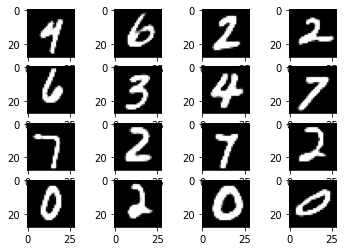

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

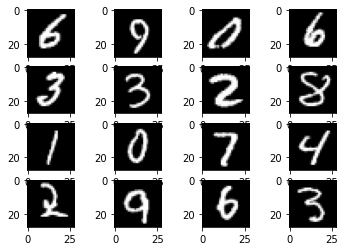

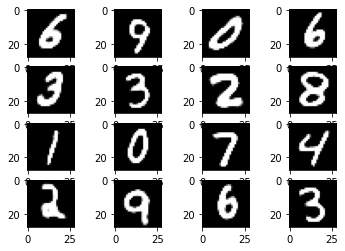

tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

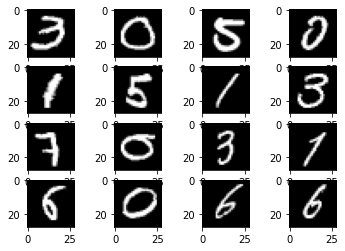

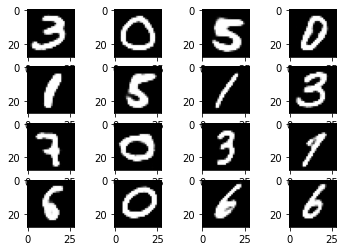

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0093, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

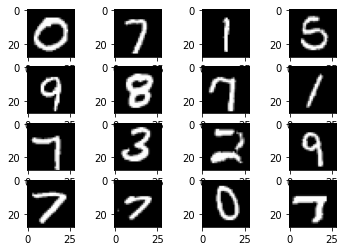

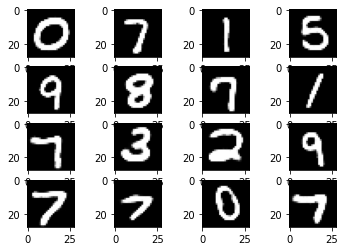

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

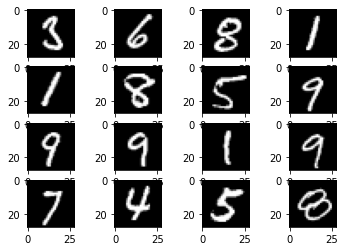

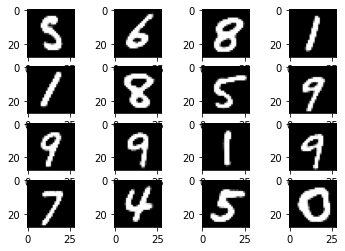

tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

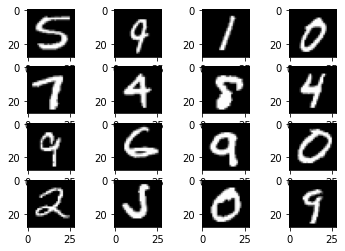

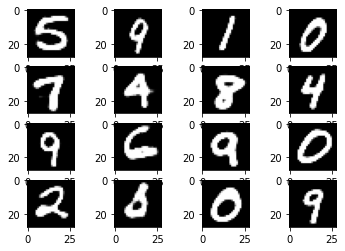

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

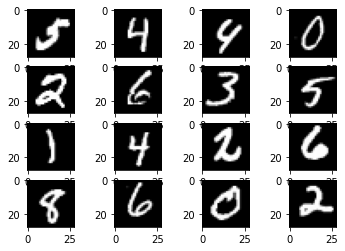

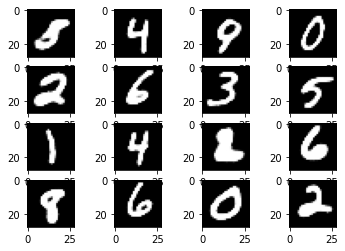

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

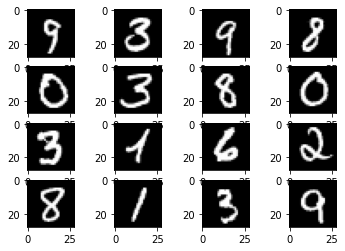

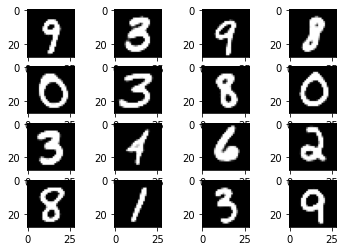

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

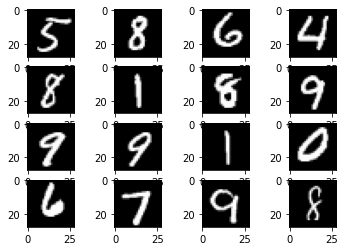

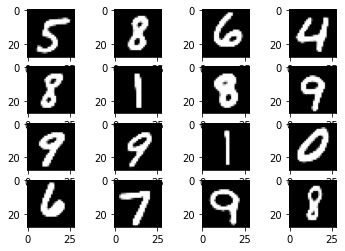

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

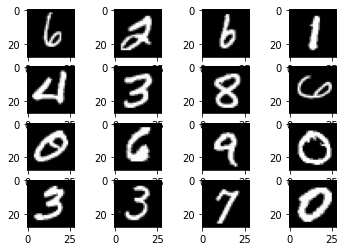

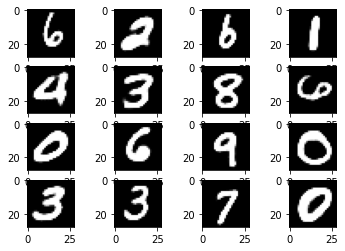

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0101, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
D loss is increasing
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntr

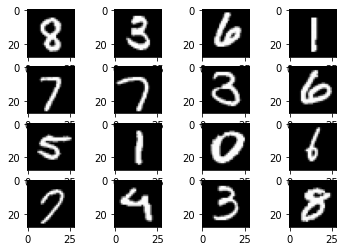

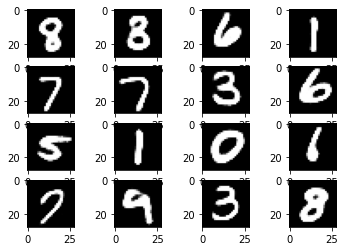

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

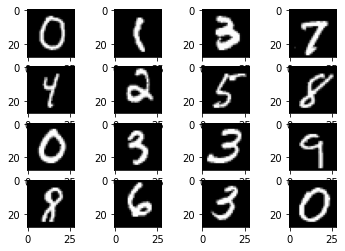

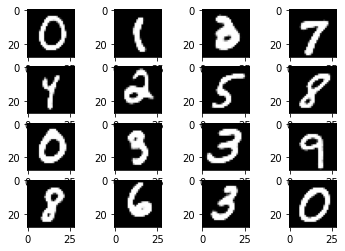

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

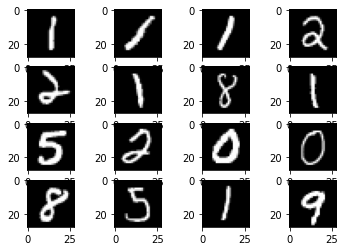

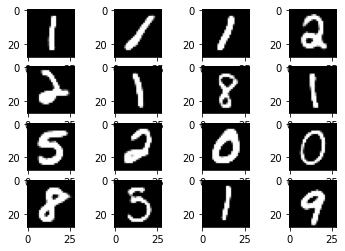

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0094, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

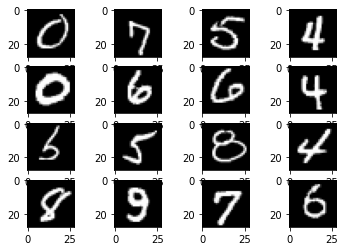

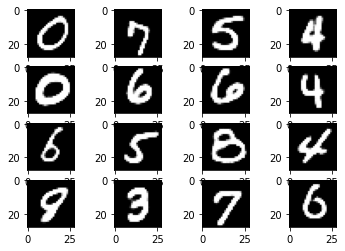

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

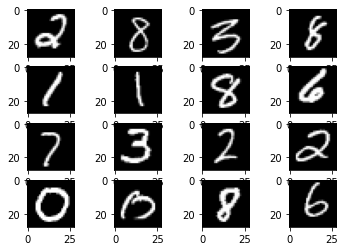

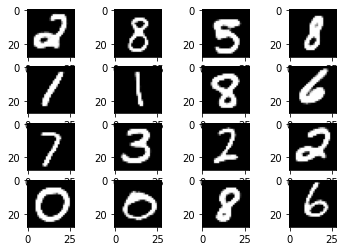

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

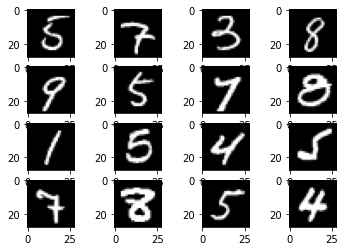

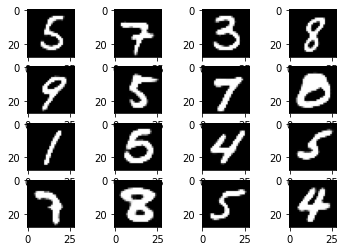

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

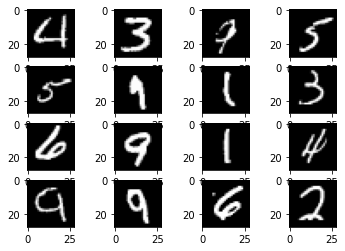

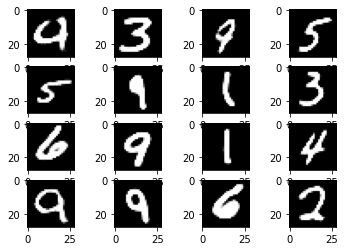

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

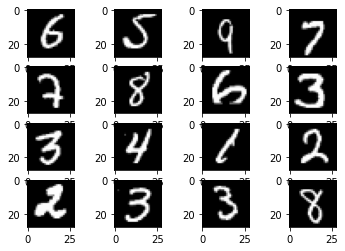

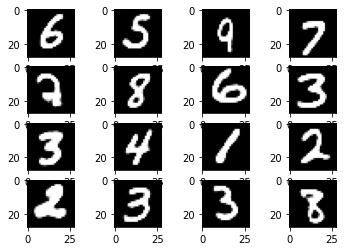

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

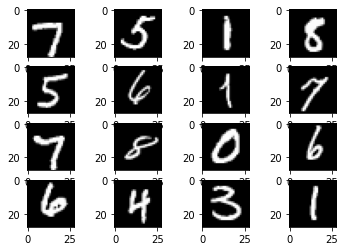

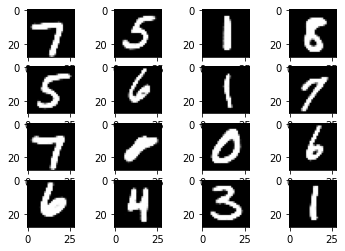

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

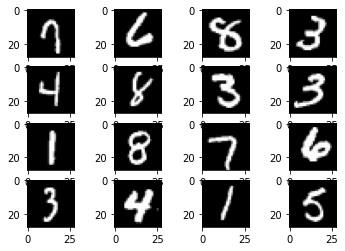

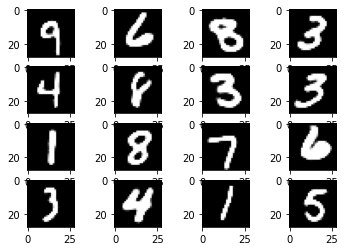

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

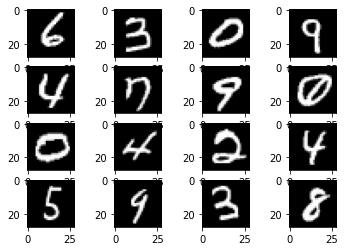

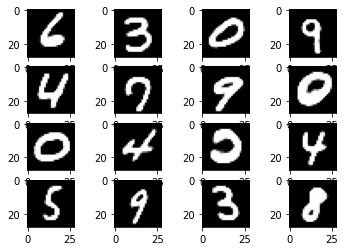

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

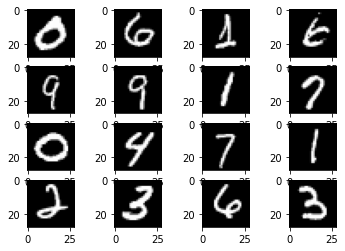

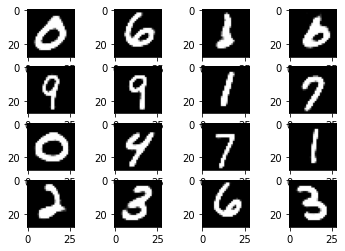

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

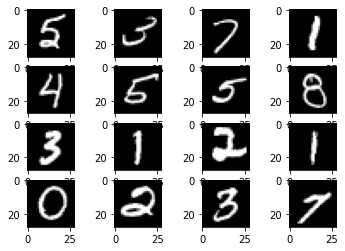

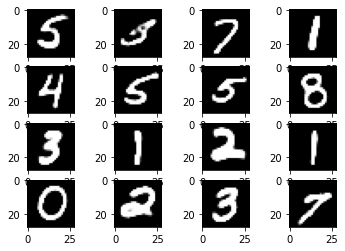

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

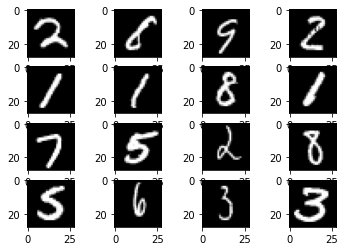

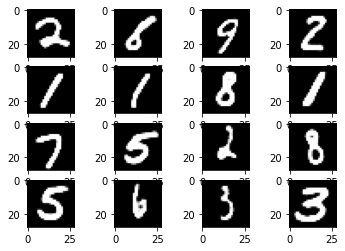

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

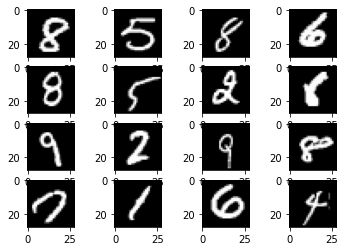

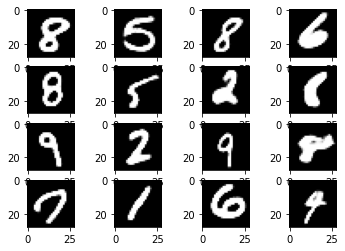

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

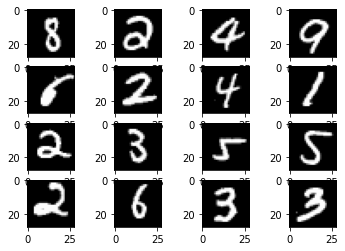

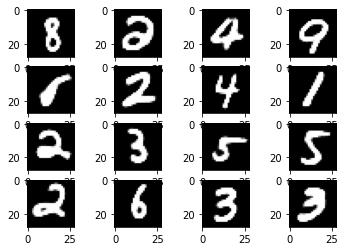

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

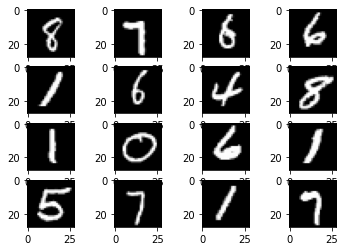

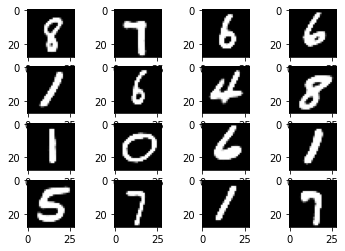

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

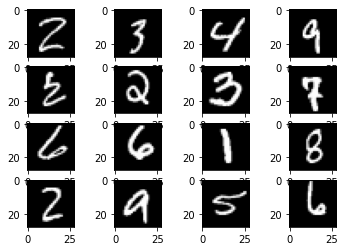

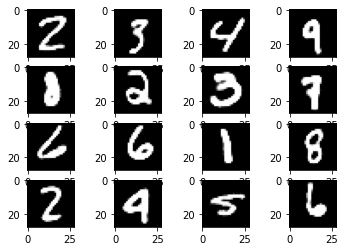

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

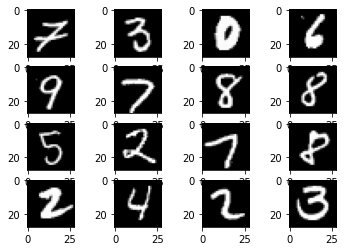

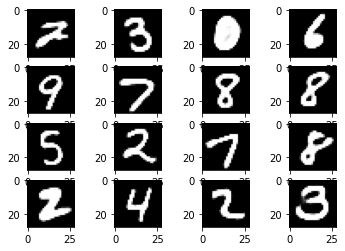

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

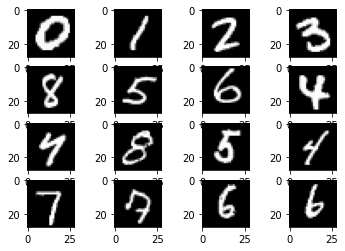

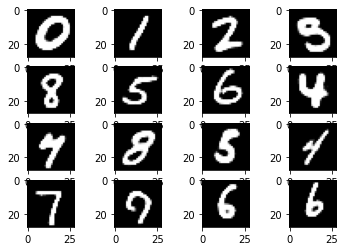

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

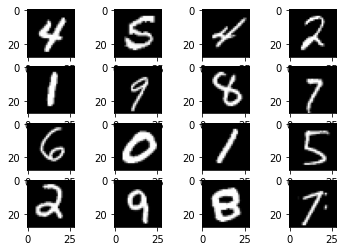

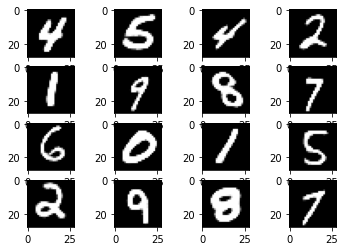

tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

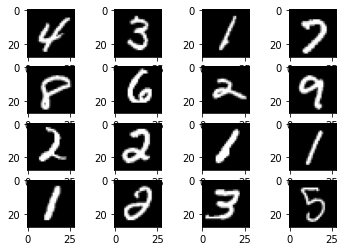

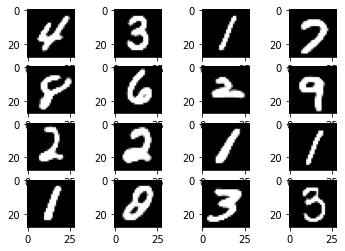

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0095, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

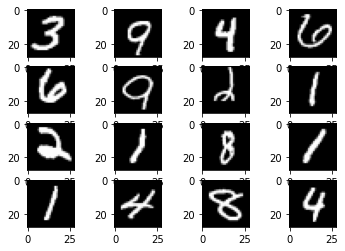

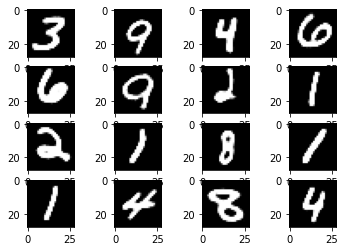

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

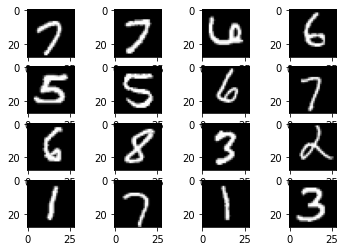

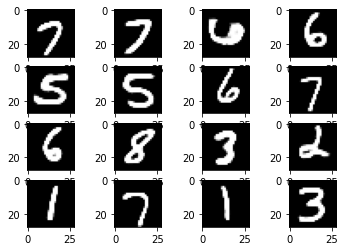

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

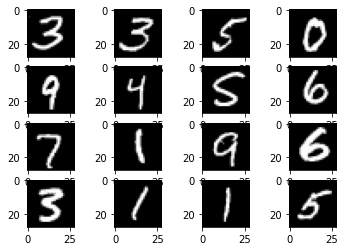

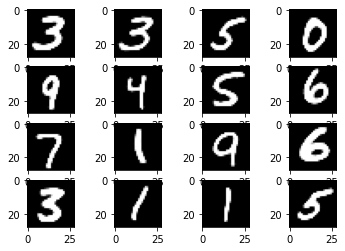

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0098, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

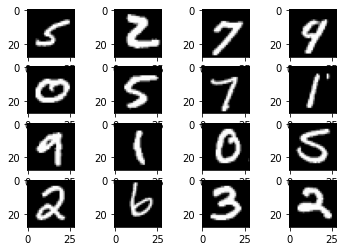

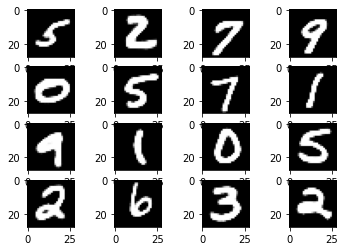

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

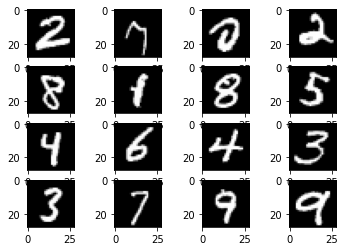

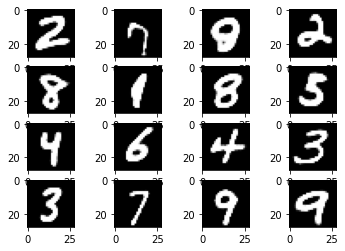

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

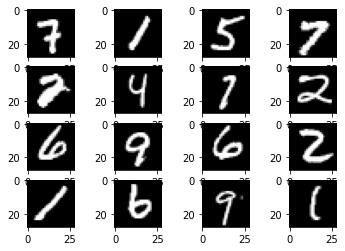

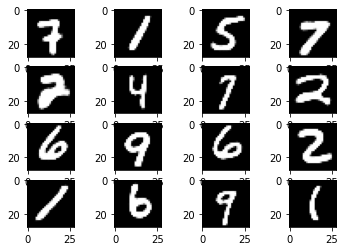

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

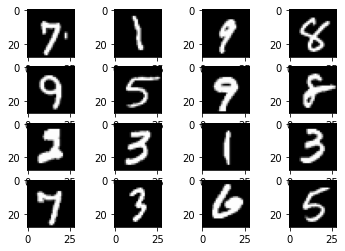

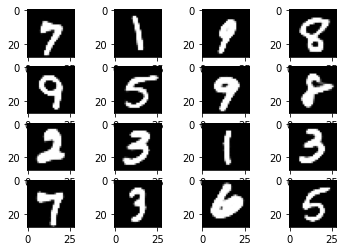

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

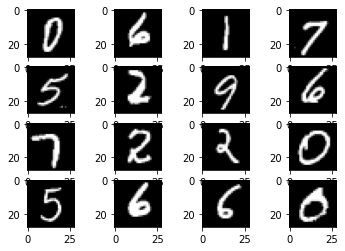

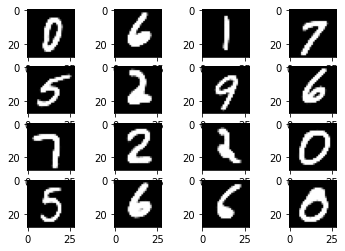

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

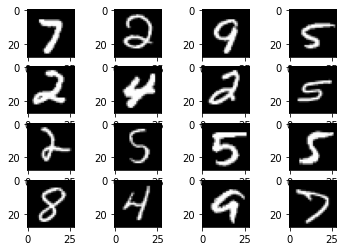

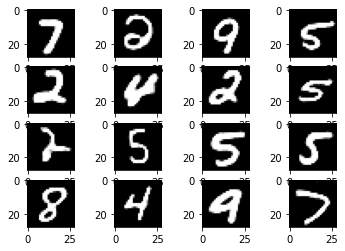

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

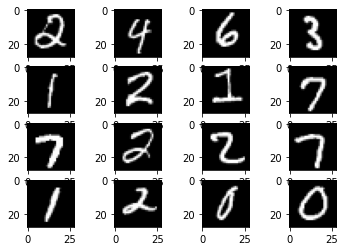

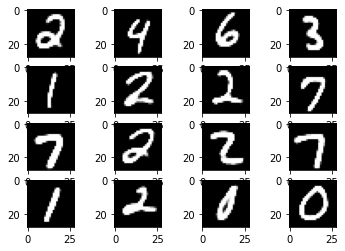

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

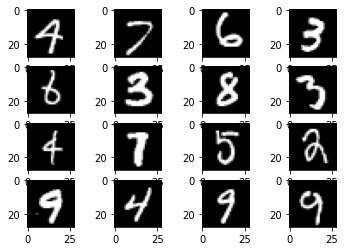

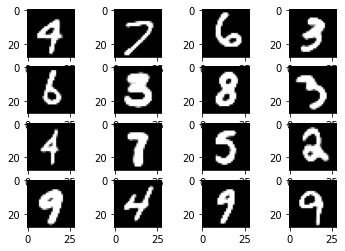

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

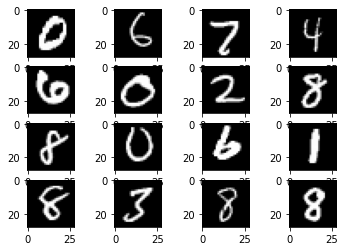

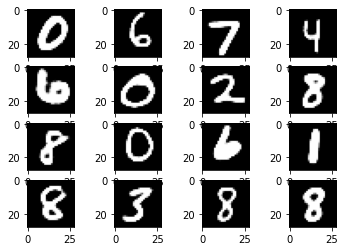

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

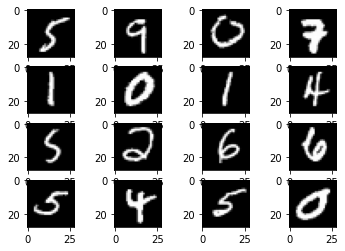

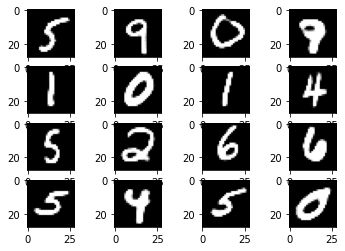

tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

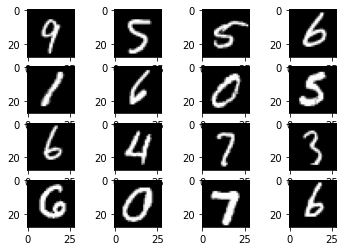

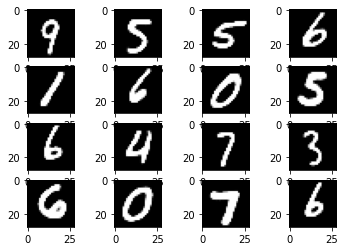

tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

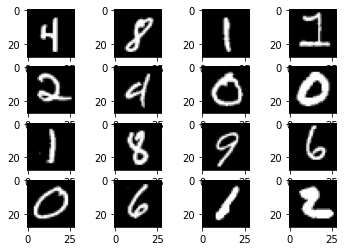

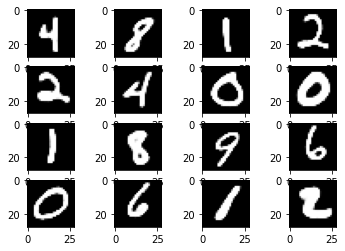

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

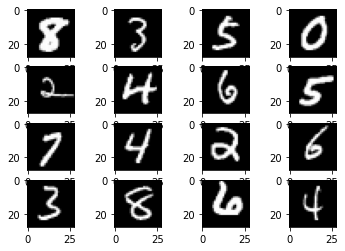

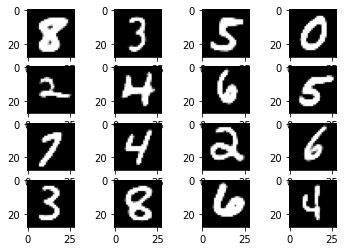

tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

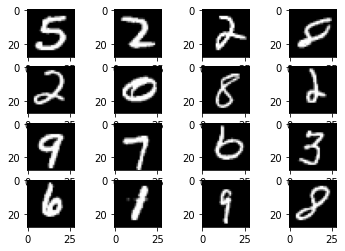

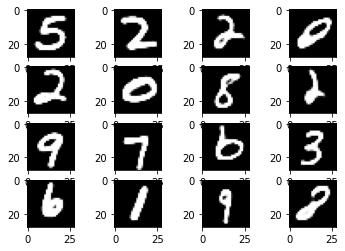

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

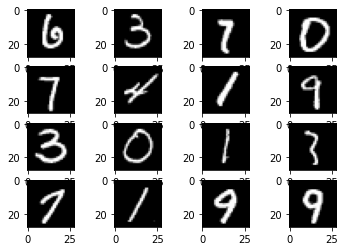

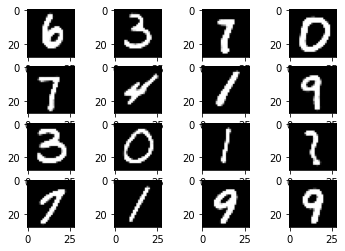

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

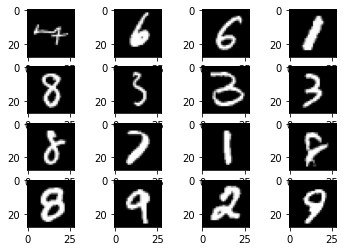

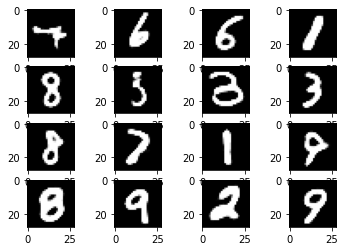

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

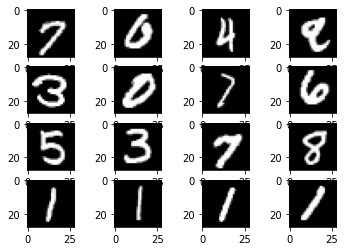

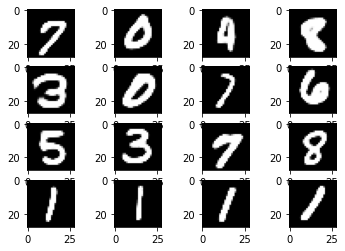

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

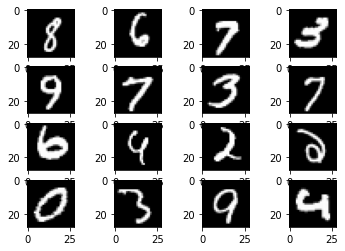

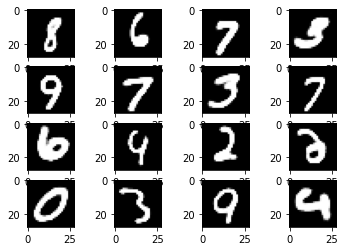

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

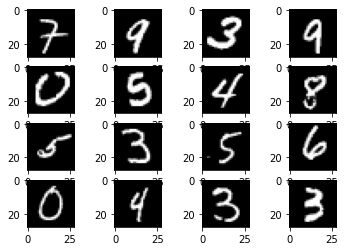

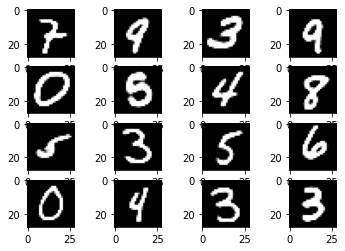

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

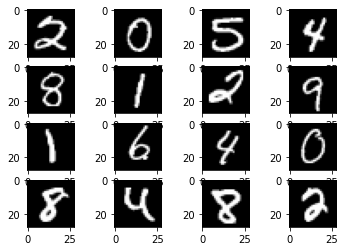

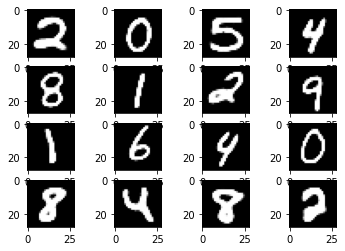

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

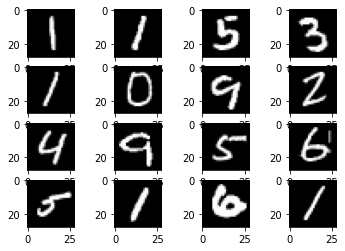

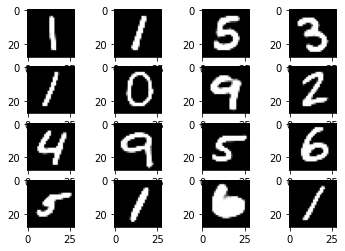

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0092, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

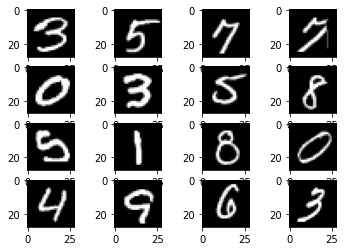

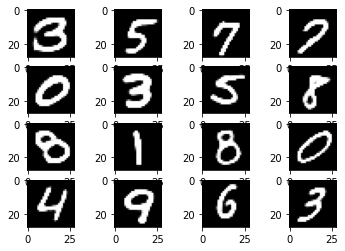

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

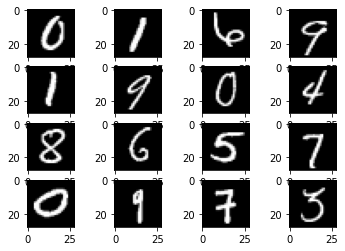

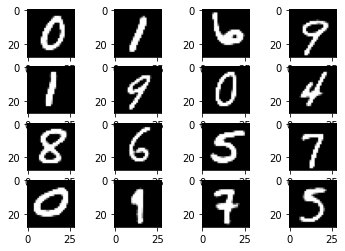

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

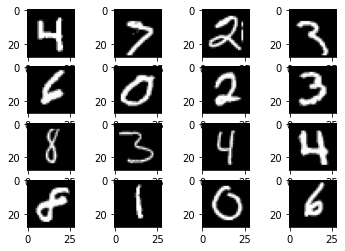

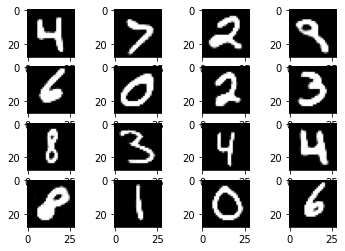

tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

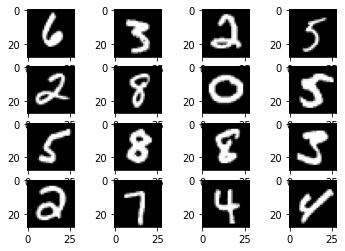

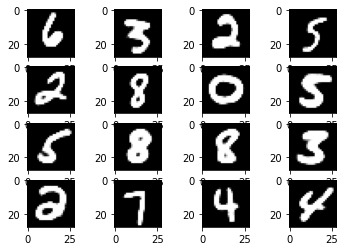

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

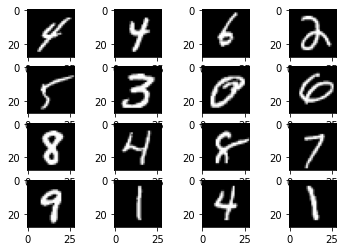

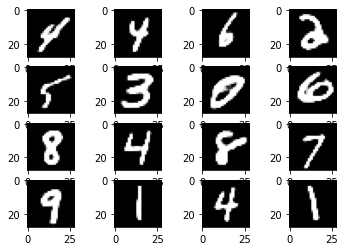

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

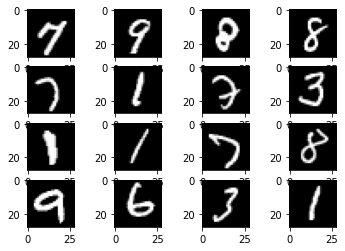

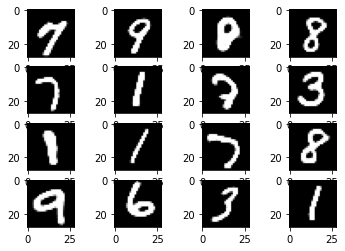

tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

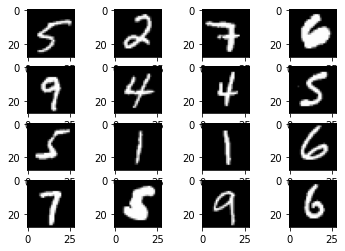

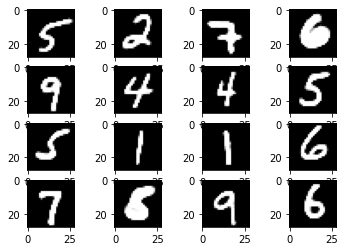

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

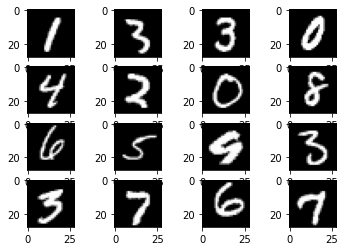

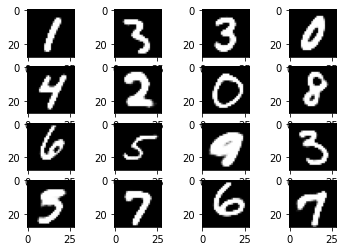

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

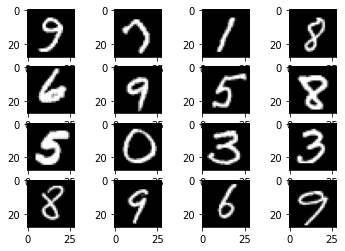

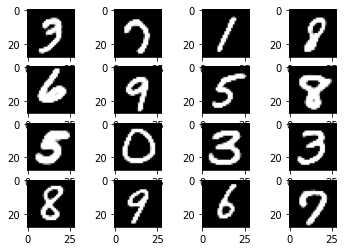

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

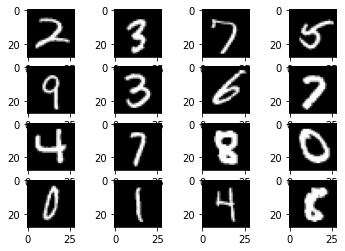

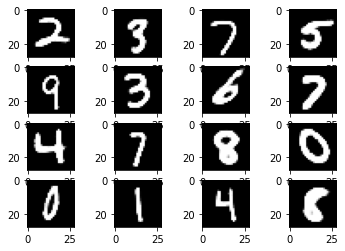

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

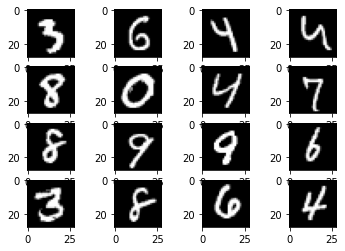

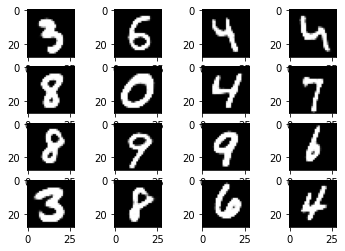

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

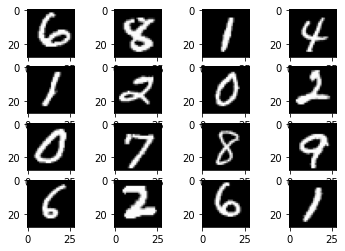

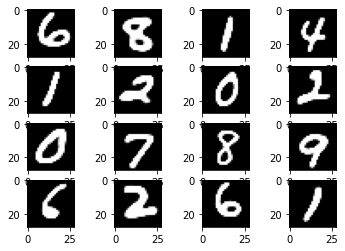

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

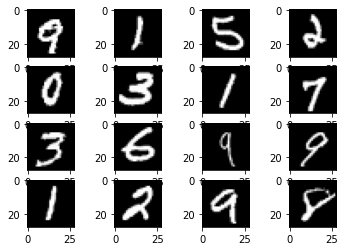

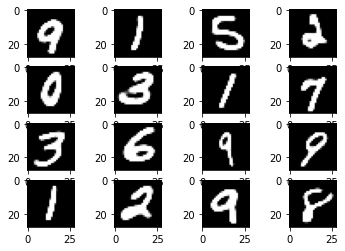

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

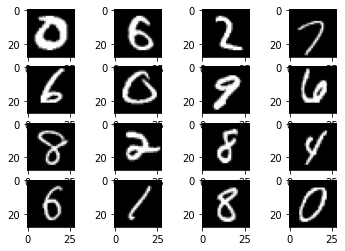

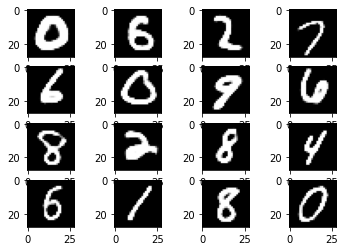

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

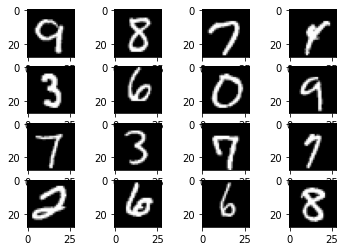

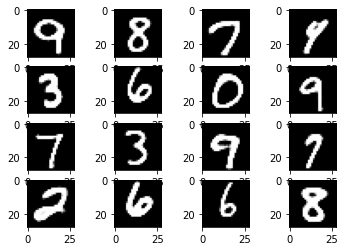

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

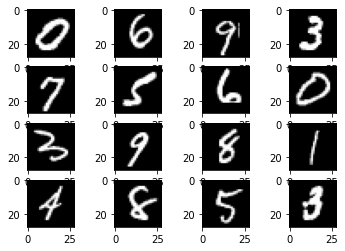

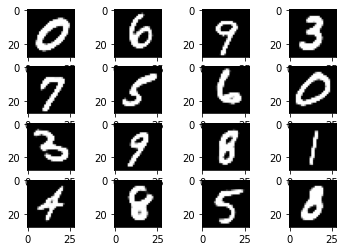

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

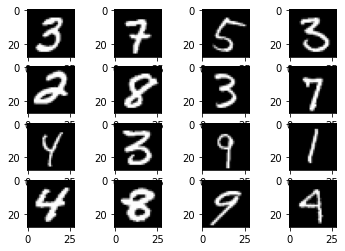

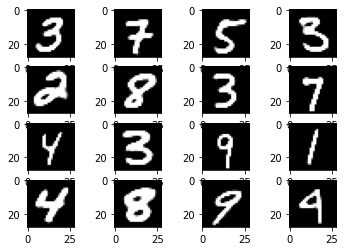

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

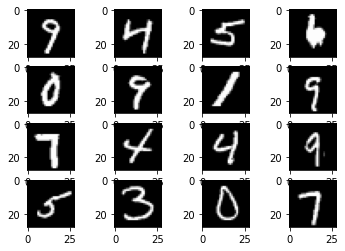

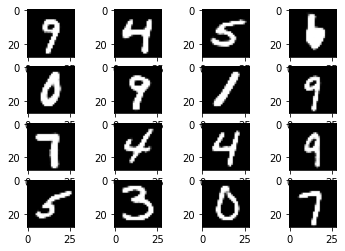

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

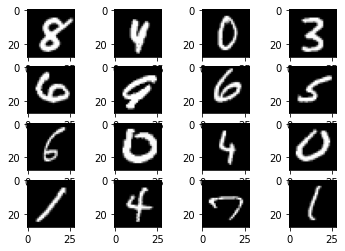

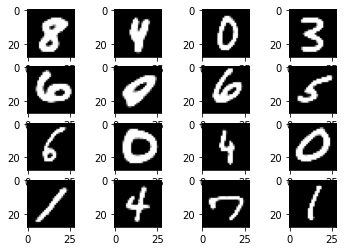

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

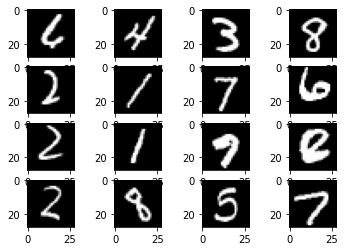

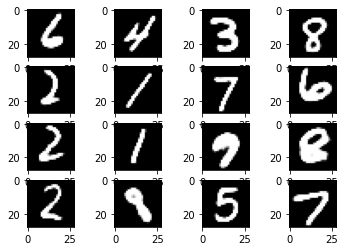

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

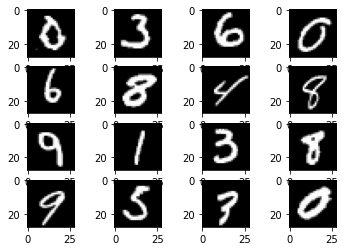

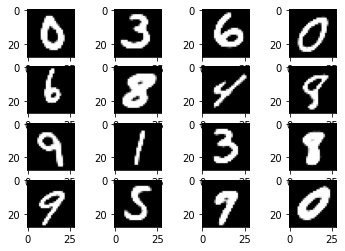

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

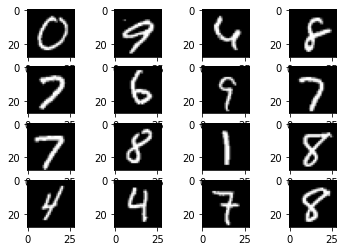

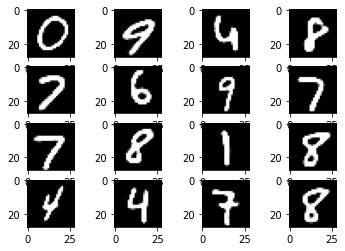

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

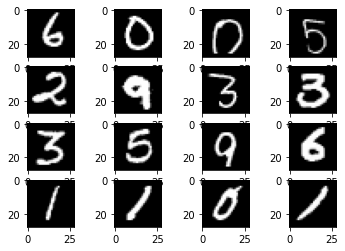

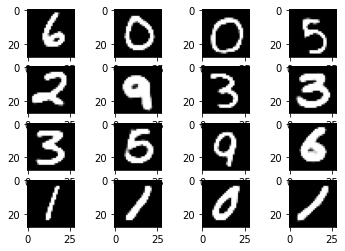

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0086, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

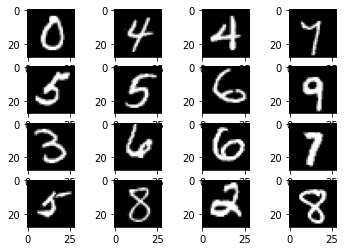

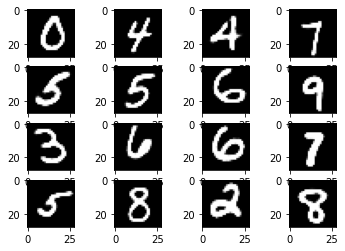

tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

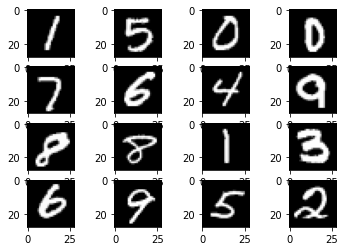

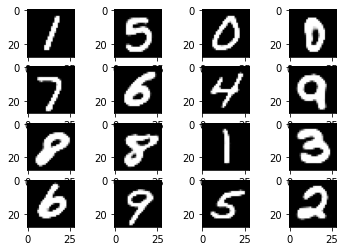

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

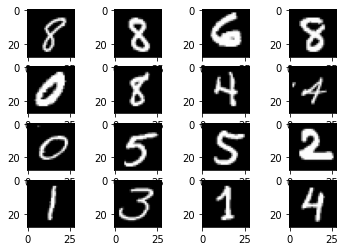

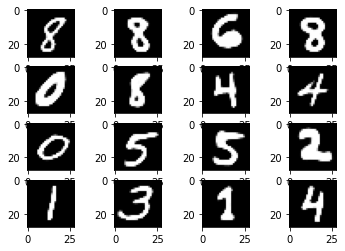

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

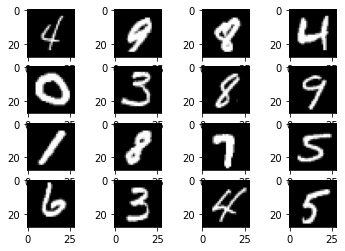

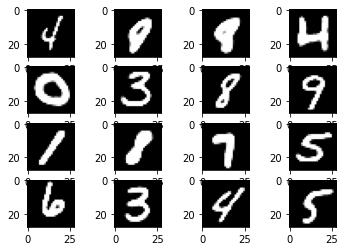

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

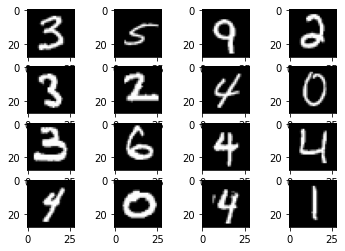

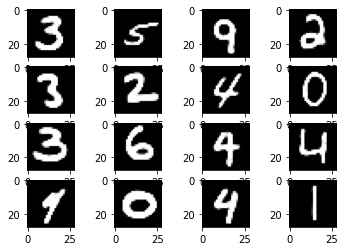

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

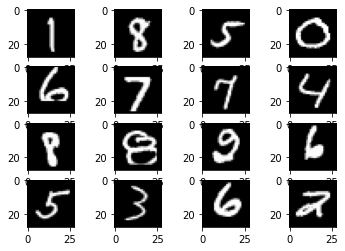

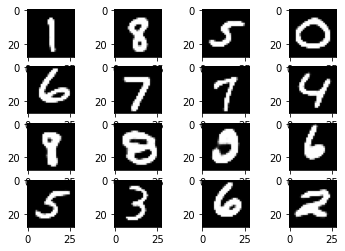

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

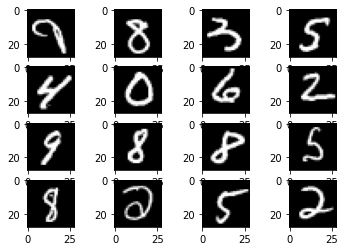

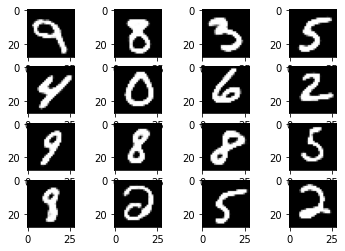

tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

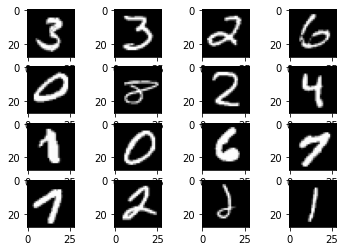

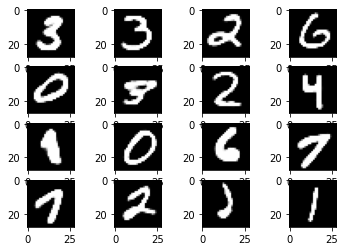

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

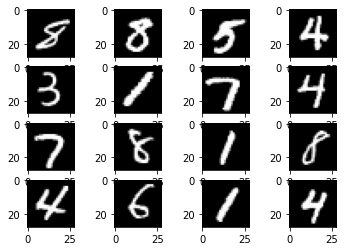

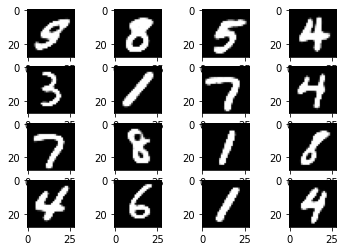

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

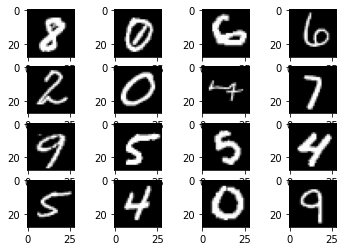

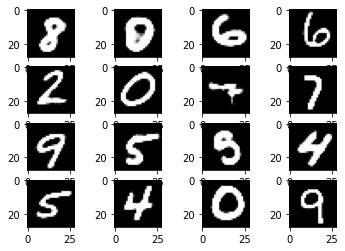

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

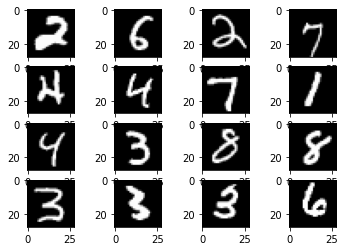

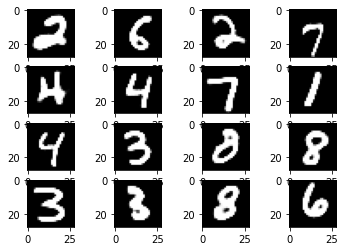

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

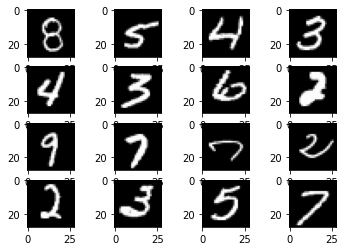

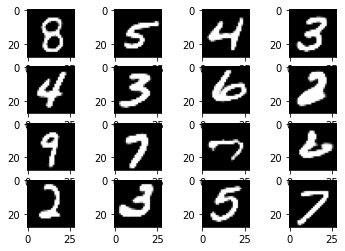

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

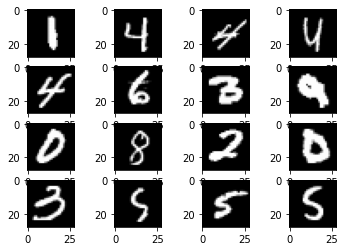

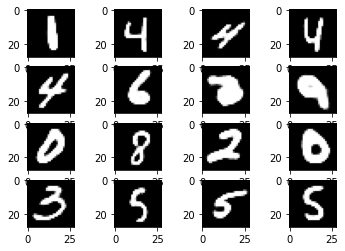

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

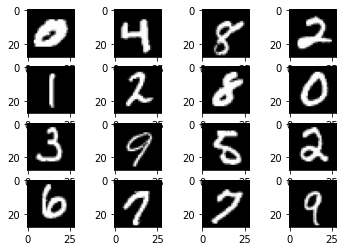

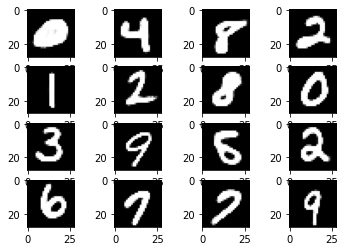

tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

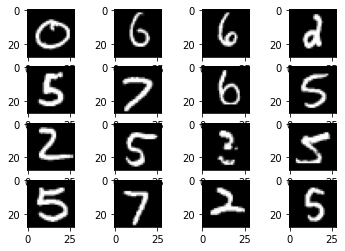

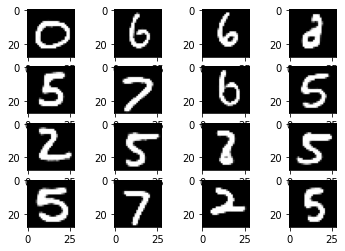

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

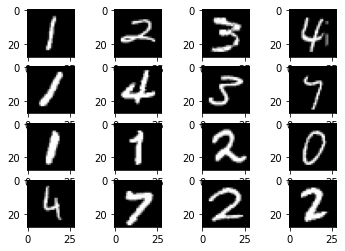

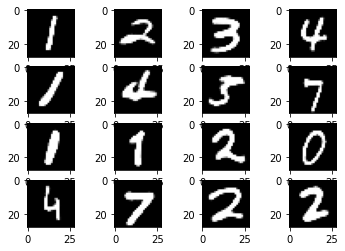

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

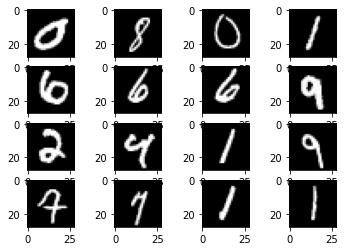

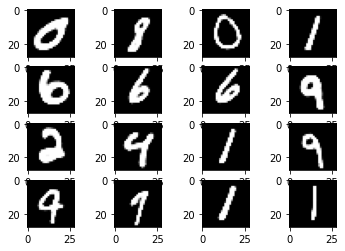

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

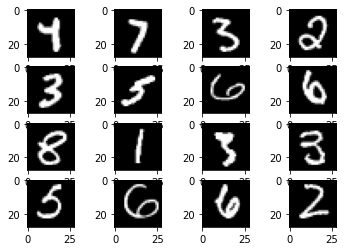

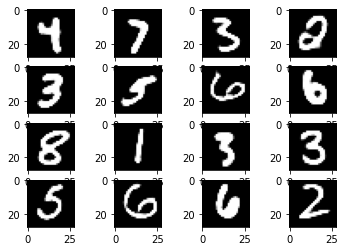

tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

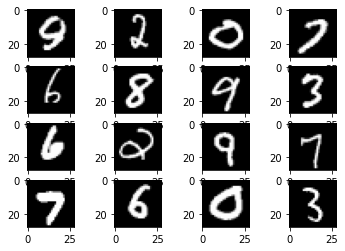

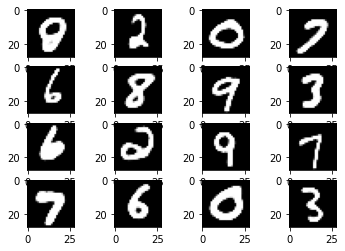

tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0081, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

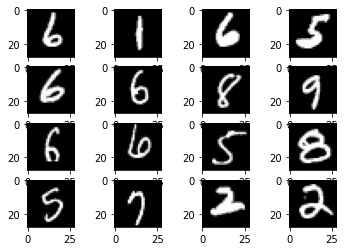

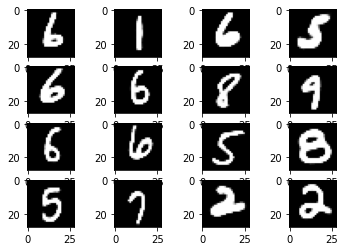

tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

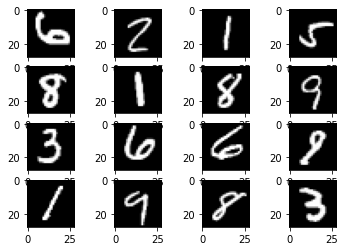

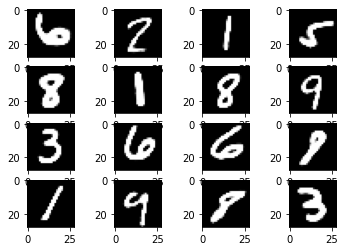

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

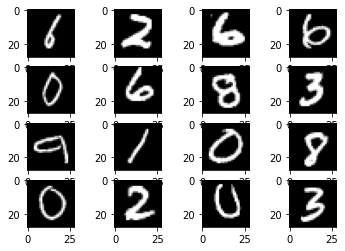

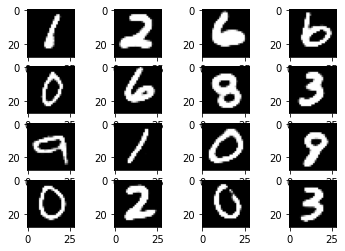

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

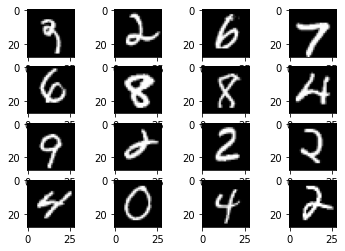

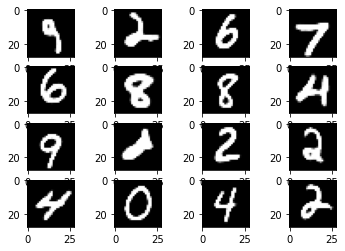

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

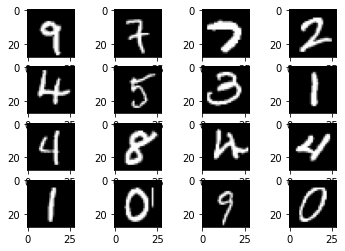

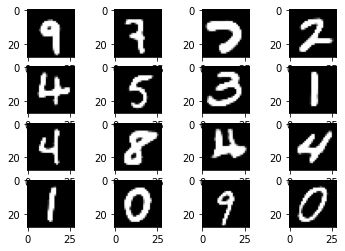

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0090, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

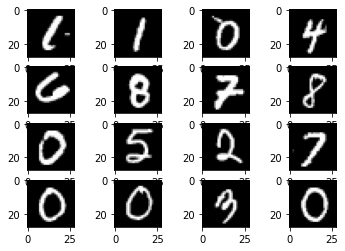

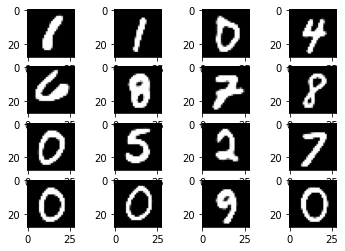

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

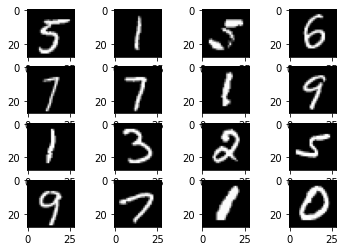

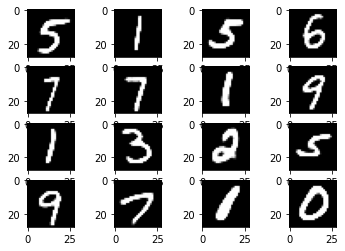

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0089, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

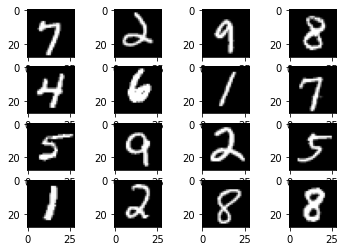

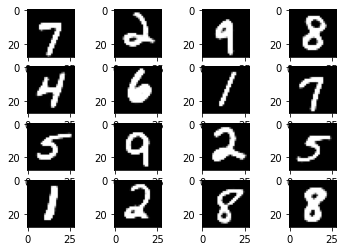

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0085, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

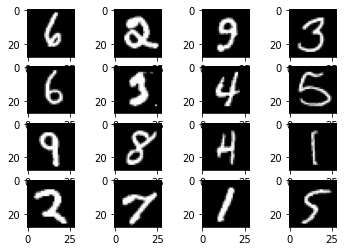

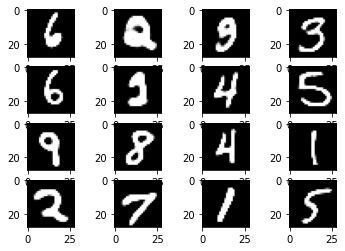

tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

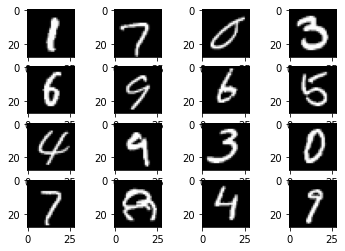

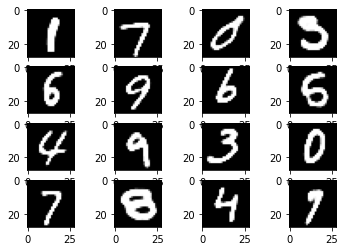

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

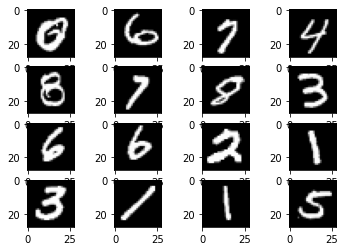

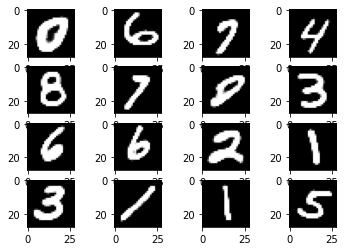

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

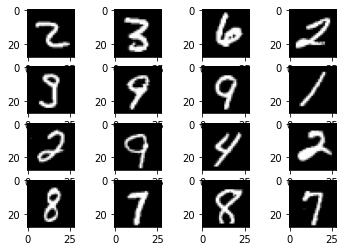

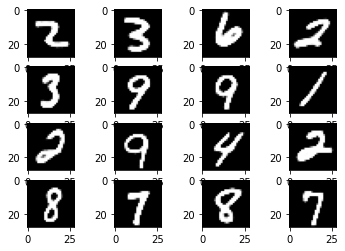

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

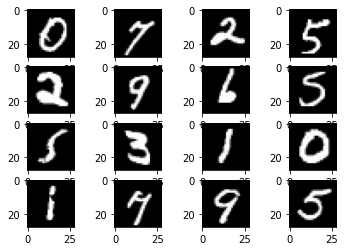

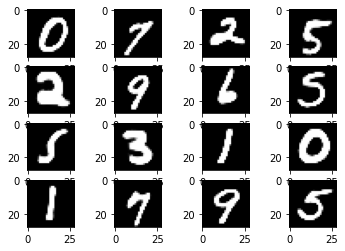

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

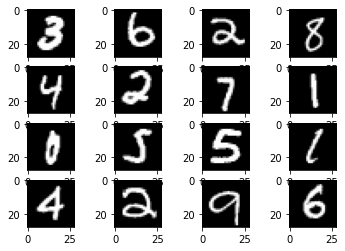

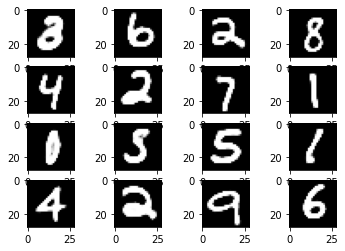

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0087, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

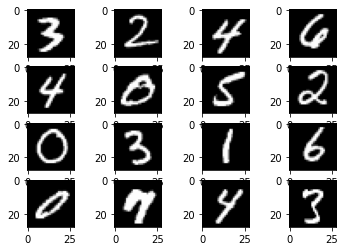

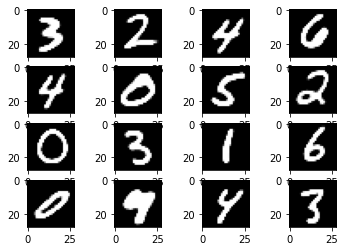

tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0076, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

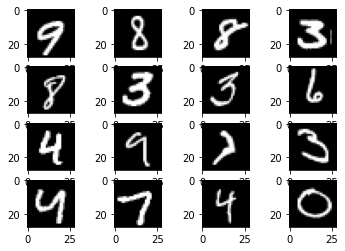

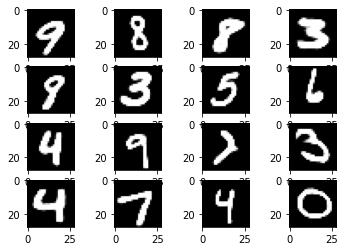

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0084, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

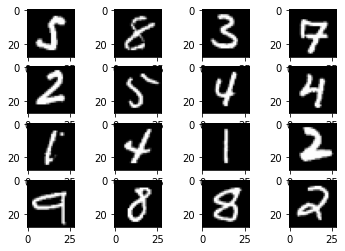

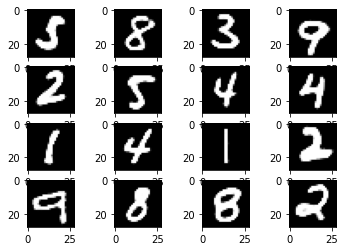

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

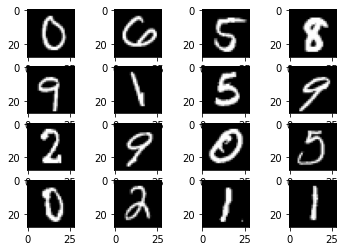

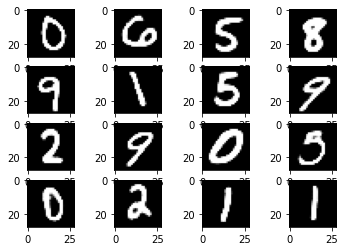

tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0103, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
D loss is increasing
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntr

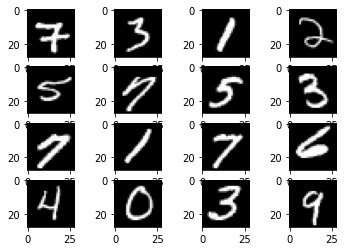

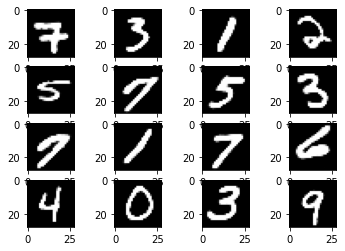

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

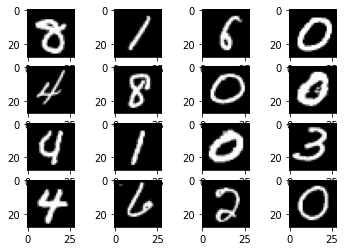

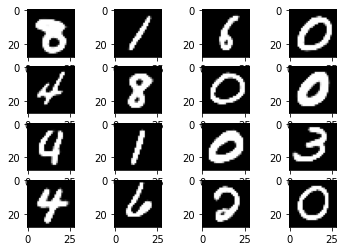

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

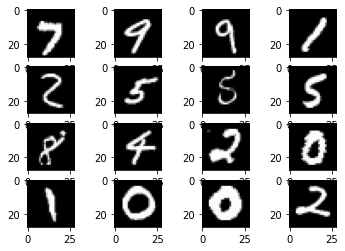

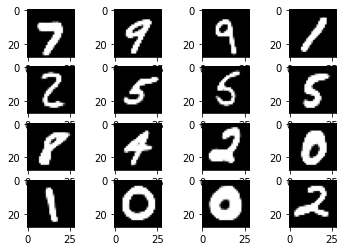

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

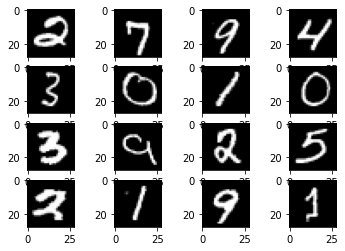

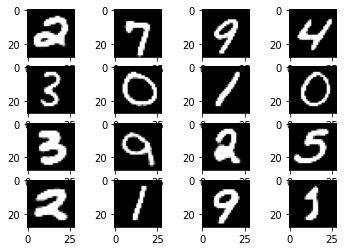

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

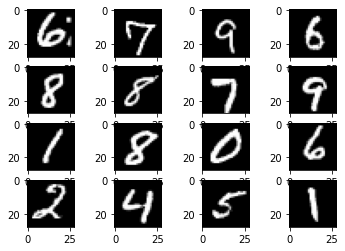

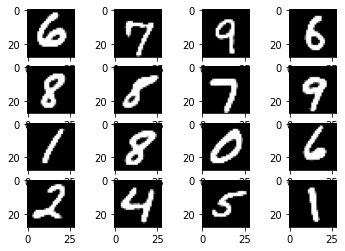

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

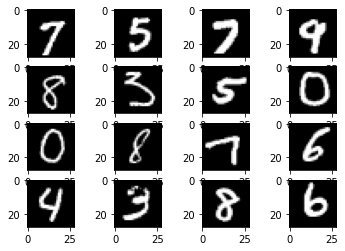

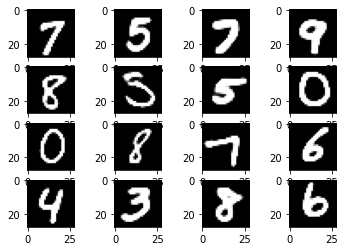

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

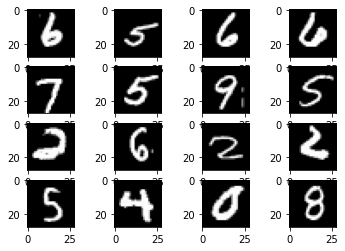

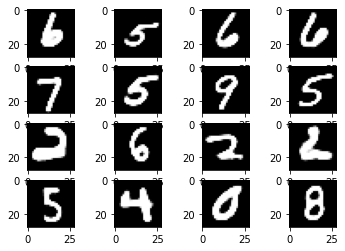

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

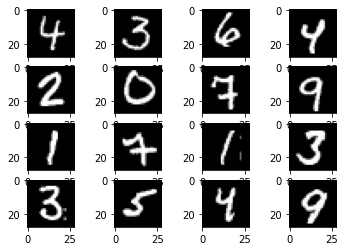

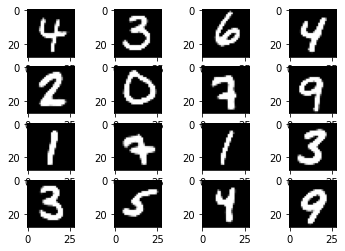

tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

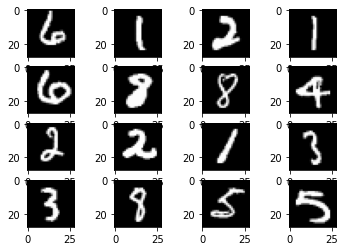

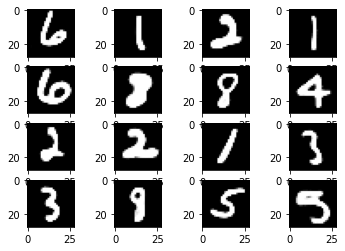

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

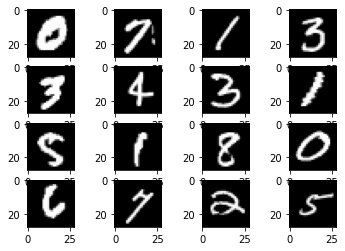

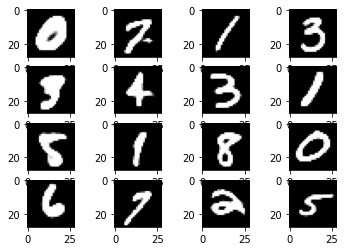

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

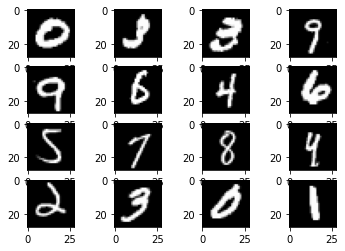

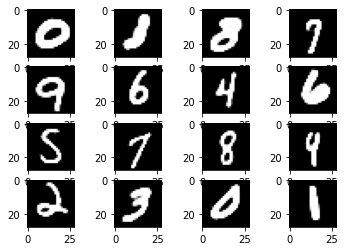

tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

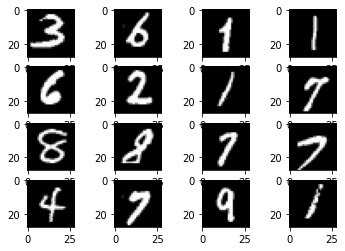

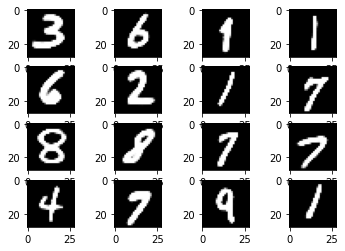

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

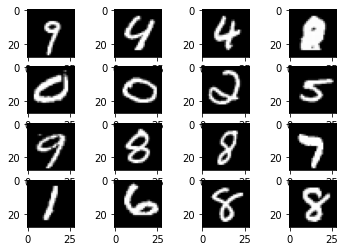

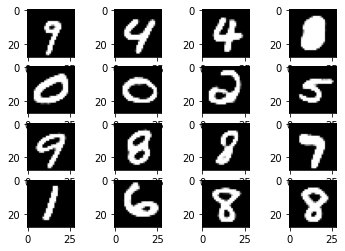

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0080, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

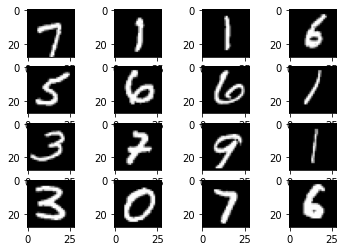

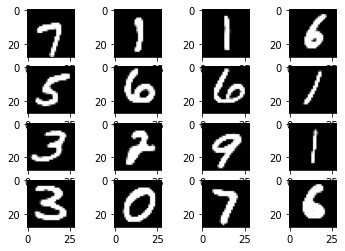

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

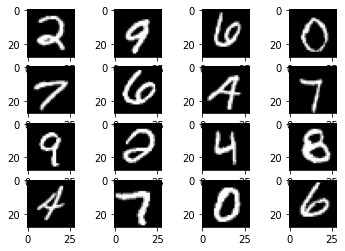

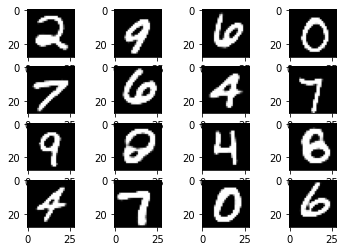

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

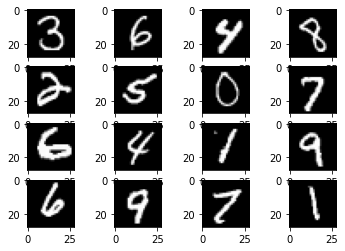

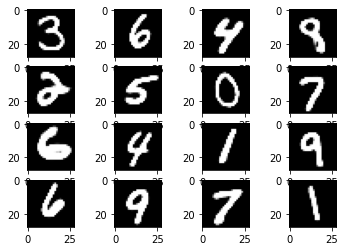

tensor(0.0041, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0038, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0050, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

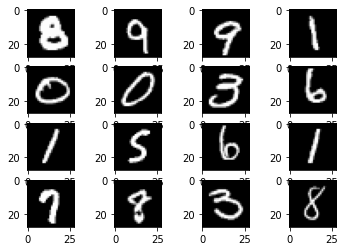

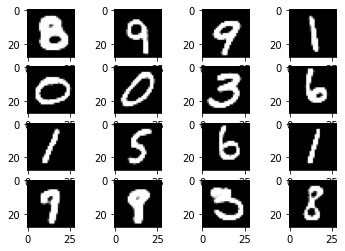

tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0049, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0048, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0050, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

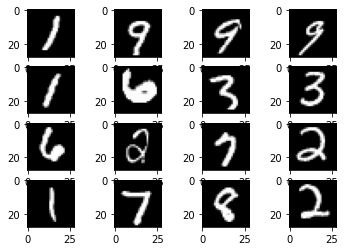

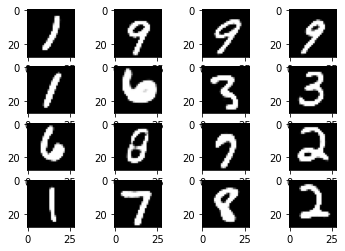

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

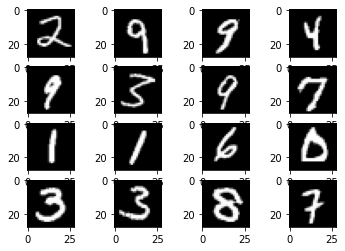

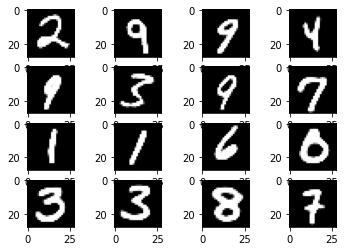

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

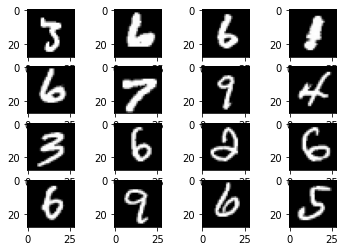

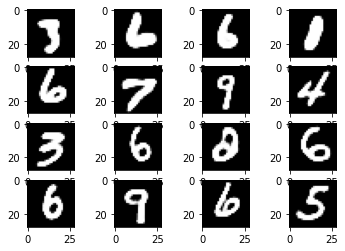

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

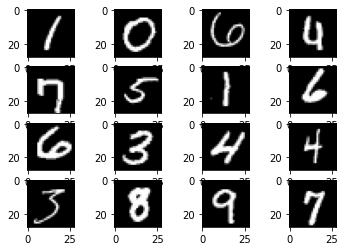

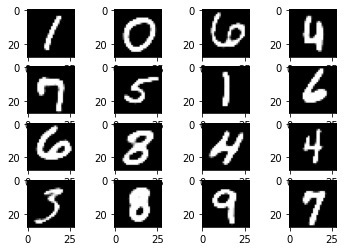

tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0088, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

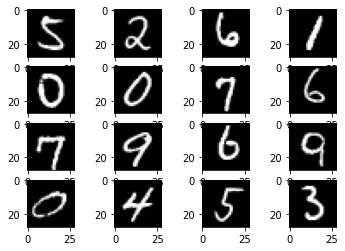

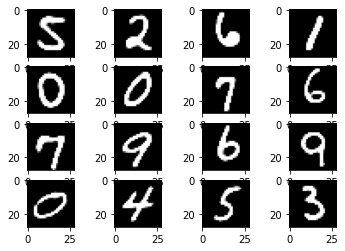

tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

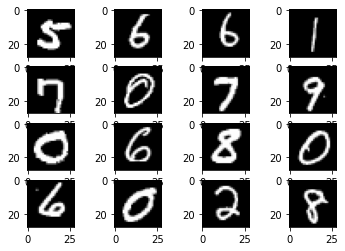

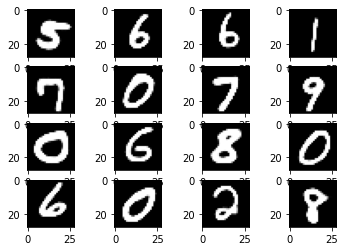

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0050, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

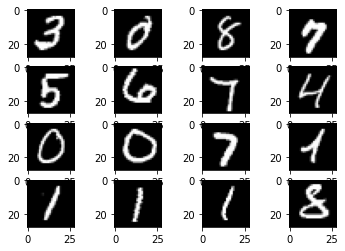

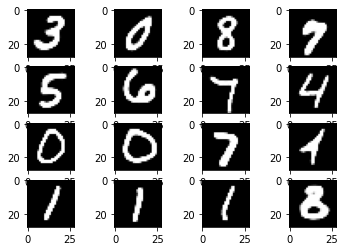

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0038, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0038, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0038, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0042, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

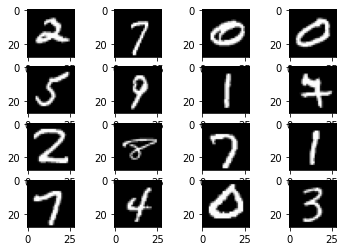

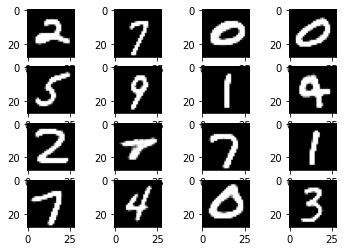

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

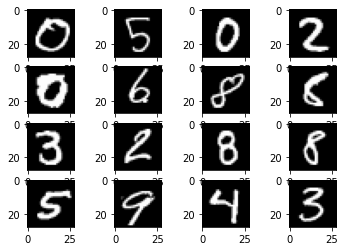

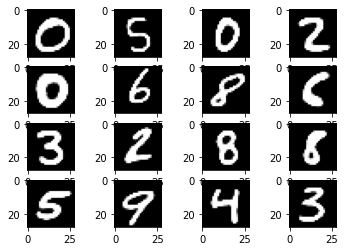

tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

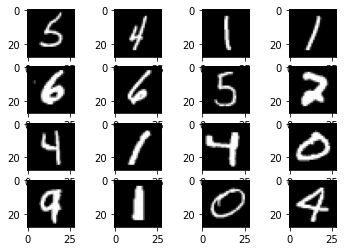

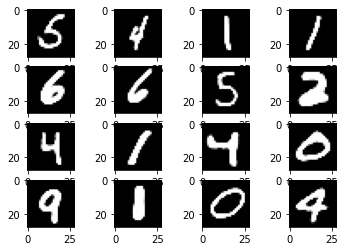

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

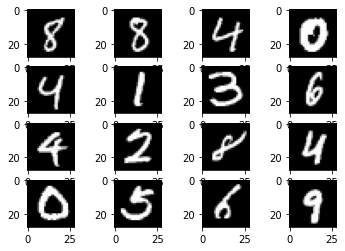

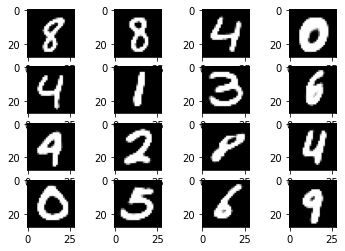

tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0082, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

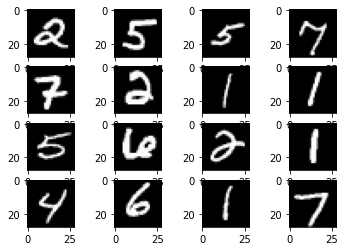

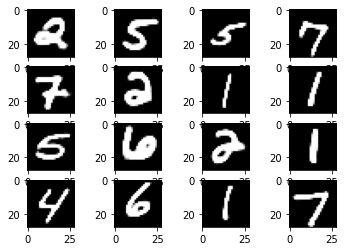

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

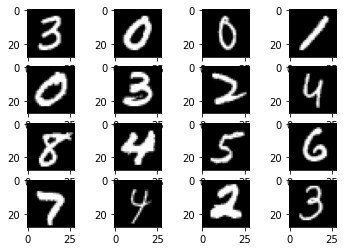

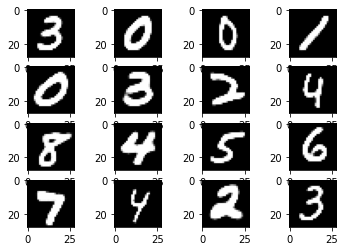

tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

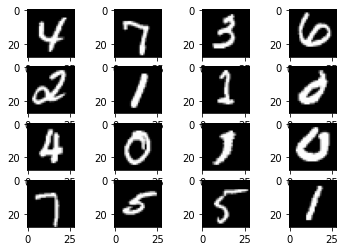

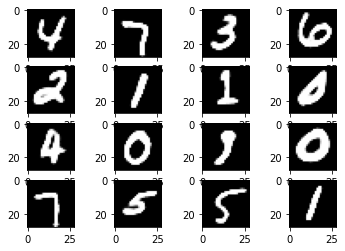

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

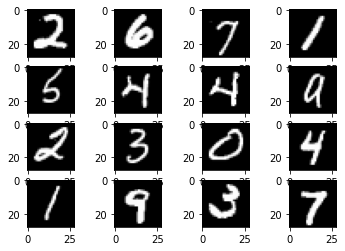

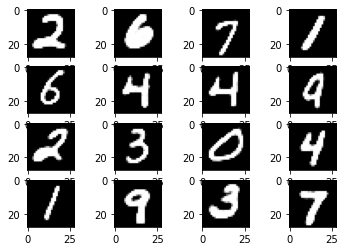

tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0071, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

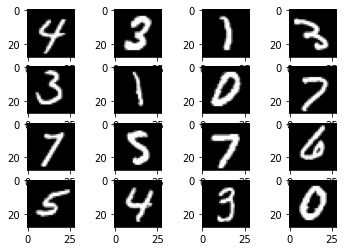

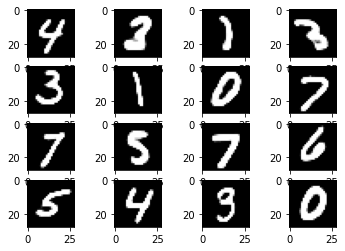

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

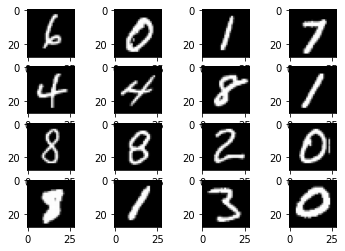

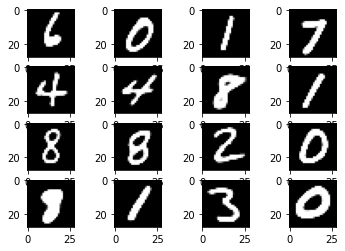

tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0078, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

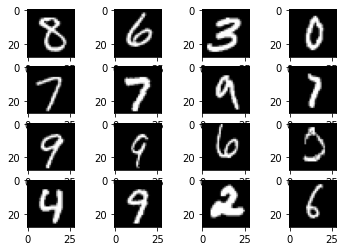

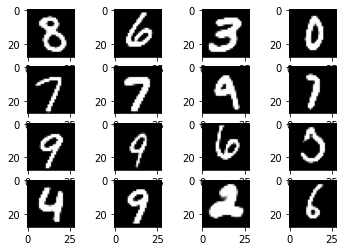

tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0069, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

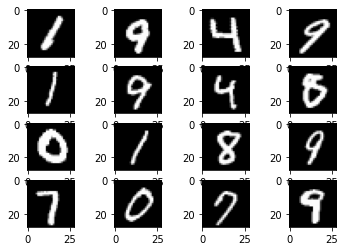

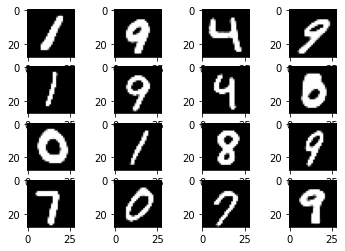

tensor(0.0083, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

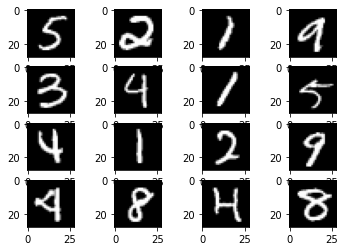

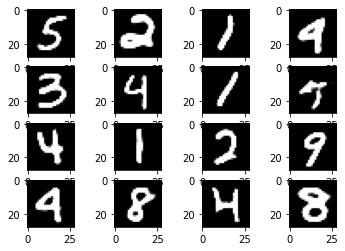

tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

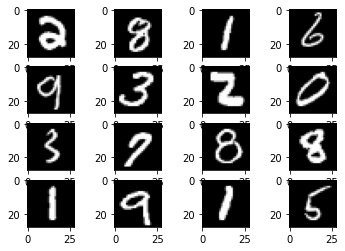

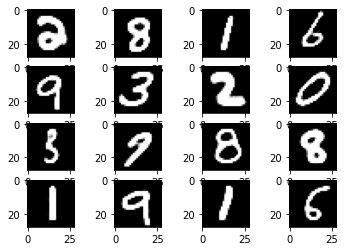

tensor(0.0072, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

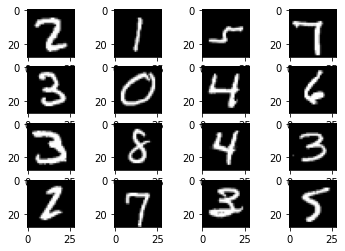

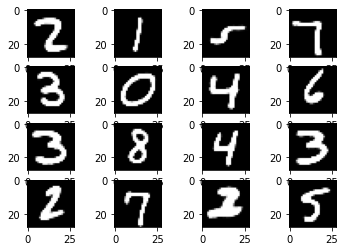

tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0079, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

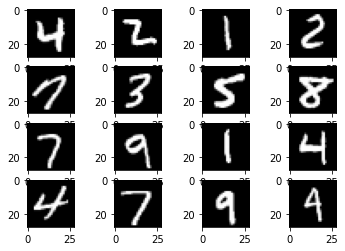

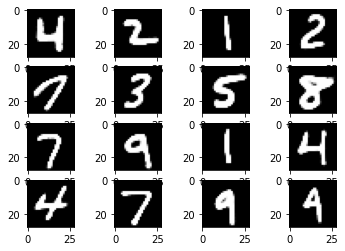

tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

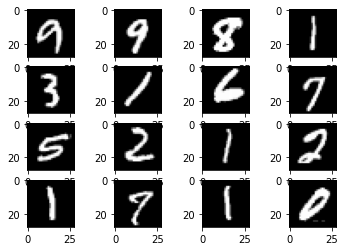

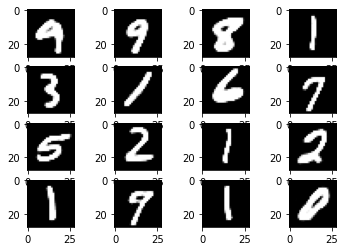

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0075, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

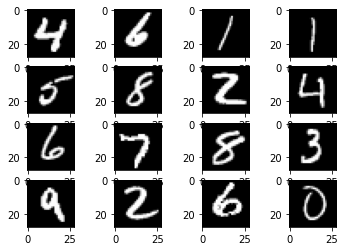

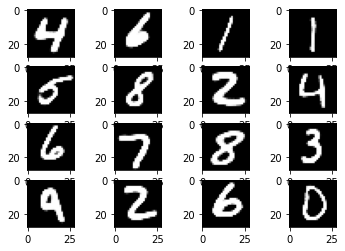

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

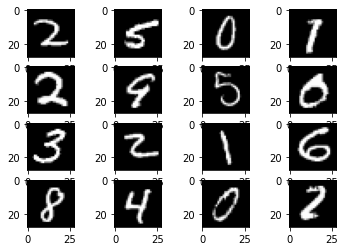

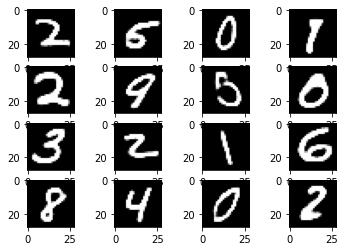

tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0074, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

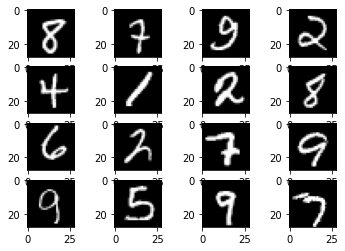

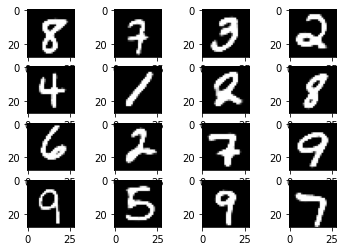

tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

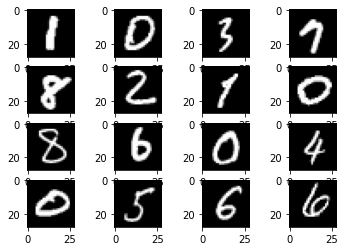

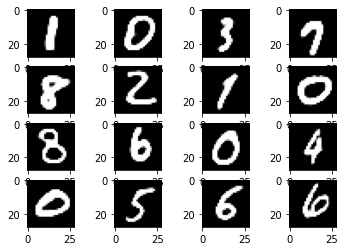

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0073, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

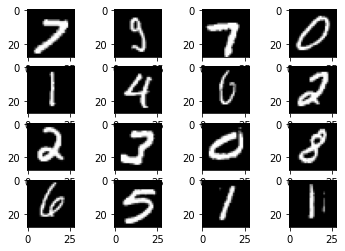

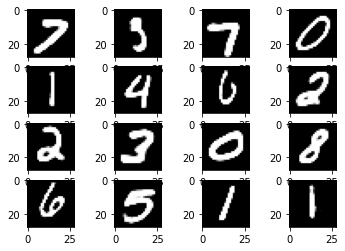

tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

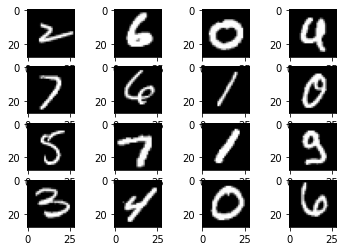

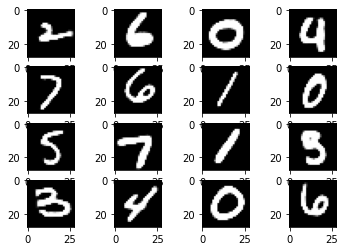

tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

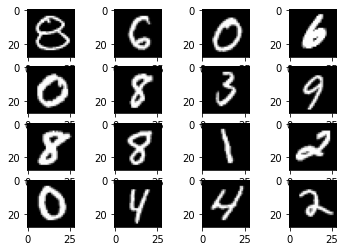

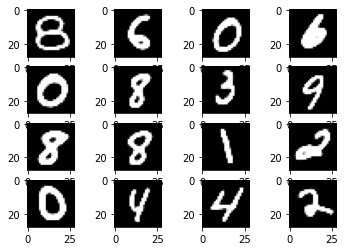

tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

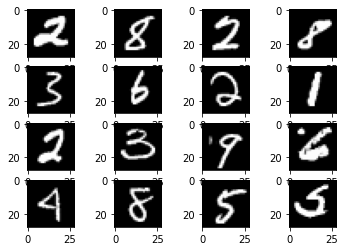

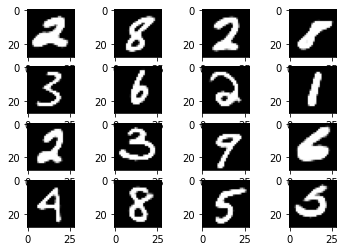

tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0068, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0064, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0070, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

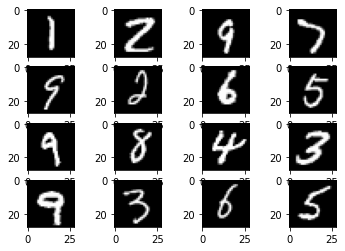

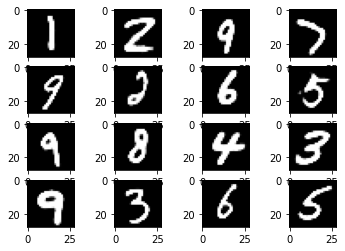

tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0077, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0058, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0055, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0096, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0067, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

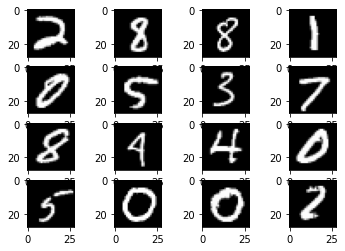

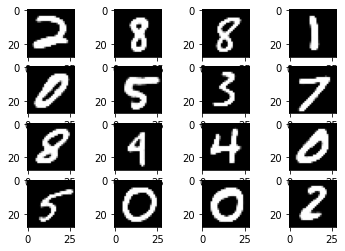

tensor(0.0051, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0053, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0063, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0066, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0052, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0056, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0061, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0057, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0054, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0059, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0060, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0065, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor(0.0062, device='cuda:0', grad_fn=<BinaryCrossEntropyBackward0>)
tensor

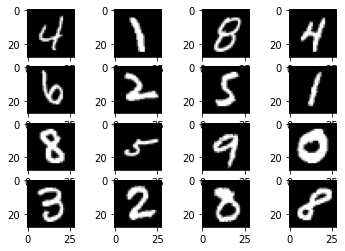

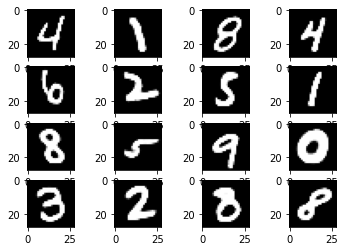

Training Finished.
Cost Time: 2524.8452713489532s


In [16]:
for epoch in range(epochs):
  
    encoder.train()
    decoder.train()
    discriminator.train()
    train_losses = []

    for times, data in enumerate(train_loader):
        times += 1
        real_inputs = data[0].to(device)
        real_inputs2 = data[0].to(device)

        real_inputs = real_inputs.view(-1, 784)
        # real_outputs = discriminator(real_inputs)      
        real_label = (torch.ones(real_inputs.shape[0], 1)*1).to(device)
        
        

        encoded_data = encoder(real_inputs2)
        decoded_data = decoder(encoded_data)

        fake_inputs = decoded_data.view(-1, 784)
        fake_label = (torch.ones(decoded_data.shape[0], 1)*0).to(device)

        real_inputs = torch.cat((real_inputs, real_label),1) 
        fake_inputs = torch.cat((fake_inputs, fake_label),1)
        # print(fake_inputs.shape)

        inputs = torch.cat((real_inputs,fake_inputs),0)
        # print(inputs.shape)

        inputs=inputs[torch.randperm(inputs.shape[0])]
        # print(inputs.shape)
        
        targets = inputs[:,inputs.shape[1]-1].view(-1,1)
        inputs = inputs[:,:inputs.shape[1]-1]
        # print(targets.shape)
        # print(inputs.shape)

        outputs = discriminator(inputs)


        #outputs = torch.cat((real_outputs, fake_outputs), 0)
        #targets = torch.cat((real_label, fake_label), 0)



        # Zero the parameter gradients
        d_optimizer.zero_grad()

        # Backward propagation
        d_loss = d_loss_function(outputs, targets)
        print(d_loss)
        if d_loss > 0.01:
          d_loss.backward()
          d_optimizer.step()
          print("D loss is increasing")

        train_losses.append(train_epoch2(encoder,decoder,device, real_inputs2,loss_fn,a_optimizer))

        if times % 100 == 0 or times == len(train_loader):
            print('[{}/{}, {}/{}] D_loss: {:.5f} G_loss: {:.5f}'.format(epoch, epochs, times, len(train_loader), d_loss.item(), np.mean(train_losses)))

    # for times, data in enumerate(train_loader):
    #     times += 1
    #     real_inputs = data[0].to(device)
    #     real_inputs2 = data[0].to(device)

    #     real_inputs = real_inputs.view(-1, 784)
    #     # real_outputs = discriminator(real_inputs)      
    #     real_label = (torch.ones(real_inputs.shape[0], 1)*1).to(device)

    #     # Generator

    #     encoded_data = encoder(real_inputs2)
    #     decoded_data = decoder(encoded_data)

    #     fake_outputs = discriminator(decoded_data.view(-1, 784))
    #     # print(fake_outputs[0])

    #     g_loss = g_loss_function(fake_outputs)
    #     g_optimizer.zero_grad()
    #     g_loss.backward()
    #     g_optimizer.step()

    #     if times % 100 == 0 or times == len(train_loader):
    #         print('[{}/{}, {}/{}] G_loss: {:.5f}'.format(epoch, epochs, times, len(train_loader), g_loss.item()))
            

    imgs_numpy = (decoded_data.view(-1, 784).data.cpu().numpy())
    imgs_numpy2 = (real_inputs2.view(-1, 784).data.cpu().numpy())
    print(imgs_numpy2.shape)
    show_images(imgs_numpy2[:16])
    plt.show()
    show_images(imgs_numpy[:16])
    plt.show()

    # if epoch % 50 == 0:
    #     torch.save(G, 'Generator_epoch_{}.pth'.format(epoch))
    #     print('Model saved.')


print('Training Finished.')
print('Cost Time: {}s'.format(time.time()-start_time))